In [320]:
# %load jupyter_default.py
import pandas as pd
import numpy as np
import os
import re
import datetime
import time
import glob
import json
from tqdm import tqdm_notebook
from colorama import Fore, Style

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.colors
import seaborn as sns

%config InlineBackend.figure_format='retina'
sns.set() # Revert to matplotlib defaults
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['axes.labelpad'] = 20
plt.rcParams['legend.fancybox'] = True
plt.style.use('ggplot')

SMALL_SIZE, MEDIUM_SIZE, BIGGER_SIZE = 14, 16, 20
plt.rc('font', size=SMALL_SIZE)
plt.rc('axes', titlesize=SMALL_SIZE)
plt.rc('axes', labelsize=MEDIUM_SIZE)
plt.rc('xtick', labelsize=SMALL_SIZE)
plt.rc('ytick', labelsize=SMALL_SIZE)
plt.rc('legend', fontsize=MEDIUM_SIZE)
plt.rc('axes', titlesize=BIGGER_SIZE)

def savefig(name):
    plt.savefig(f'../../figures/{name}.png', bbox_inches='tight', dpi=300)

%reload_ext autoreload
%autoreload 2
    
%reload_ext version_information
%version_information pandas, numpy

Software versions
Python 3.6.8 64bit [GCC 4.2.1 Compatible Clang 4.0.1 (tags/RELEASE_401/final)]
IPython 6.4.0
OS Darwin 16.7.0 x86_64 i386 64bit
pandas 0.23.4
numpy 1.14.2
Fri May 03 15:11:36 2019 PDT

In [386]:
from google.cloud import bigquery
from slugify import slugify

In [3]:
from dotenv import load_dotenv
load_dotenv('../../.env')

True

In [4]:
client = bigquery.Client()

# Sales Forecasting
Alex's development notebook for sales forecasting.

## Read data

### Read from bigquery

In [14]:
table_id = 'ga_sessions_20160801'
query_job = client.query('''
    select date, sum(totals.totalTransactionRevenue)
    from `bigquery-public-data.google_analytics_sample.{}`
    group by date
    limit 10;
'''.format(table_id))
results = query_job.result()

In [18]:
dict(results)

{'20160801': 6288060000}

In [49]:
%%time
"""
Using bigquery
"""

def pull_daily_data(verbose=False):
    dataset = client.get_dataset('bigquery-public-data.google_analytics_sample')

    data = []
    for table in tqdm_notebook(list(client.list_tables(dataset))):
        if verbose:
            print('Querying {}'.format(table.table_id))
        query_job = client.query('''
            select
              date,
              sum(totals.visits),
              sum(totals.pageviews),
              sum(totals.transactions),
              sum(totals.transactionRevenue)
            from `bigquery-public-data.google_analytics_sample.{}`
            group by date;
        '''.format(table.table_id))
        results = query_job.result().to_dataframe()
        results.columns = ['date', 'visits', 'pageviews', 'transactions', 'transactionRevenue']
        data.append(results)

    df = pd.concat(data, ignore_index=True, sort=False)
    return df

bq_results = pull_daily_data()


CPU times: user 7.94 s, sys: 856 ms, total: 8.8 s
Wall time: 11min 29s


In [53]:
bq_results.head()

,date,visits,pageviews,transactions,transactionRevenue
0,20160801,1711,9843,34,6116060000
1,20160802,2140,11784,18,1361190000
2,20160803,2890,13724,None,None
3,20160804,3161,13326,17,1182890000
4,20160805,2702,13585,42,5594260000


### Read `jsonl` from google drive

In [7]:
%%time
"""
Using gdrive jsonl
"""
ERRORS = []

def pull_daily_data(verbose=False, raise_errors=False):
    dataset = sorted(glob.glob('/Volumes/GoogleDrive/My Drive/bigquery_ga_sample/*.jsonl'))

    data = []
    for table in tqdm_notebook(dataset):
        if verbose:
            print('Scanning {}'.format(table))
        with open(table, 'r') as f:
            table_data = []
            for line in f:
                d = json.loads(line)
                date = d['date']
                d = d['totals']
                try:
                    table_data.append([
                        date,
                        d['visits'],
                        d['pageviews'],
                        d['transactions'],
                        d['transactionRevenue'],
                    ])
                except Exception as e:
                    if verbose:
                        print('Error raised when reading row:\n{}'.format(e))
                    ERRORS.append([table, e])
                    if raise_errors:
                        raise(e)

            cols = ['date', 'visits', 'pageviews', 'transactions', 'transactionRevenue']
            results = (
                pd.DataFrame(table_data, columns=cols)
                    .groupby('date')[['visits', 'pageviews', 'transactions', 'transactionRevenue']]
                    .sum().reset_index()
            )
            data.append(results)

    df = pd.concat(data, ignore_index=True, sort=False)
    return df

jsonl_gdrive_results = pull_daily_data()


CPU times: user 7min 55s, sys: 1min 56s, total: 9min 52s
Wall time: 23min 14s


In [8]:
jsonl_gdrive_results

,date,visits,pageviews,transactions,transactionRevenue
0,20160801,1711,9843.0,34.0,6.116060e+09
1,20160802,2140,11784.0,18.0,1.361190e+09
2,20160803,2890,13724.0,NaN,NaN
3,20160804,3161,13326.0,17.0,1.182890e+09
4,20160805,2702,13585.0,42.0,5.594260e+09
5,20160806,1663,6926.0,10.0,1.891040e+09
6,20160807,1622,7239.0,16.0,2.410730e+09
7,20160808,2815,13179.0,36.0,5.273810e+09
8,20160809,2851,13411.0,44.0,5.596400e+09
9,20160810,2757,13003.0,46.0,4.284210e+09


### Read `jsonl` from local

In [139]:
%%time
"""
Using local jsonl
"""
ERRORS = []

def pull_daily_data(verbose=False, raise_errors=False):
    dataset = sorted(glob.glob('../../data/raw/*.jsonl'))

    data = []
    for table in tqdm_notebook(dataset):
        if verbose:
            print('Scanning {}'.format(table))
        with open(table, 'r') as f:
            table_data = []
            for line in f:
                d = json.loads(line)
                date = d['date']
                d = d['totals']
                try:
                    table_data.append([
                        date,
                        d['visits'],
                        d['pageviews'],
                        d['transactions'],
                        d['transactionRevenue'],
                    ])
                except Exception as e:
                    if verbose:
                        print('Error raised when reading row:\n{}'.format(e))
                    ERRORS.append([table, e])
                    if raise_errors:
                        raise(e)

            cols = ['date', 'visits', 'pageviews', 'transactions', 'transactionRevenue']
            results = (
                pd.DataFrame(table_data, columns=cols)
                    .groupby('date')[['visits', 'pageviews', 'transactions', 'transactionRevenue']]
                    .sum().reset_index()
            )
            data.append(results)

    df = pd.concat(data, ignore_index=True, sort=False)
    return df

jsonl_results = pull_daily_data()


CPU times: user 5min 13s, sys: 18.5 s, total: 5min 32s
Wall time: 5min 37s


In [161]:
df = jsonl_results.copy()
df.date = pd.to_datetime(df.date)
df.to_csv('../../data/interim/sales_forecast_raw.csv', index=False)

In [166]:
def load_file(f_path):
    if not os.path.exists(f_path):
        print('No data found. Run data load script above.')
        return
    print('Loading {}'.format(f_path))
    df = pd.read_csv(f_path)
    df.date = pd.to_datetime(df.date)
    return df

# Looking forward to walrus operator for stuff like this...
tmp = load_file('../../data/interim/sales_forecast_raw.csv')
if tmp is not None:
    print('Loading from file')
    df = tmp.copy()
    del tmp

Loading ../../data/interim/sales_forecast.csv
Loading from file


In [167]:
df.head()

,date,visits,pageviews,transactions,transactionRevenue
0,2016-08-01,1711,9843.0,34.0,6.116060e+09
1,2016-08-02,2140,11784.0,18.0,1.361190e+09
2,2016-08-03,2890,13724.0,NaN,NaN
3,2016-08-04,3161,13326.0,17.0,1.182890e+09
4,2016-08-05,2702,13585.0,42.0,5.594260e+09


In [168]:
df['week'] = df.date.apply(lambda x: x.strftime('%W'))
df['year'] = df.date.apply(lambda x: x.strftime('%Y'))
df['week_start'] = df[['week', 'year']].apply(
    lambda x: datetime.datetime.strptime('{}-{}-1'.format(x.year, x.week), '%Y-%W-%w'),
    axis=1
)

In [169]:
df.dtypes

date                  datetime64[ns]
visits                         int64
pageviews                    float64
transactions                 float64
transactionRevenue           float64
week                          object
year                          object
week_start            datetime64[ns]
dtype: object

How does the data look? Is there seasonality that I can predict?

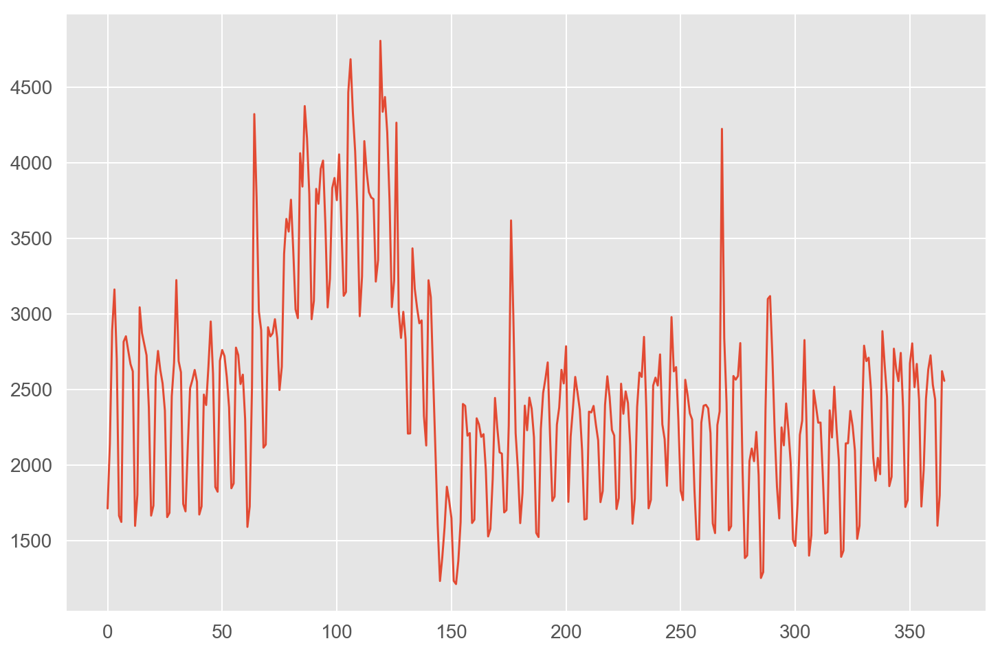

In [170]:
df.visits.plot()

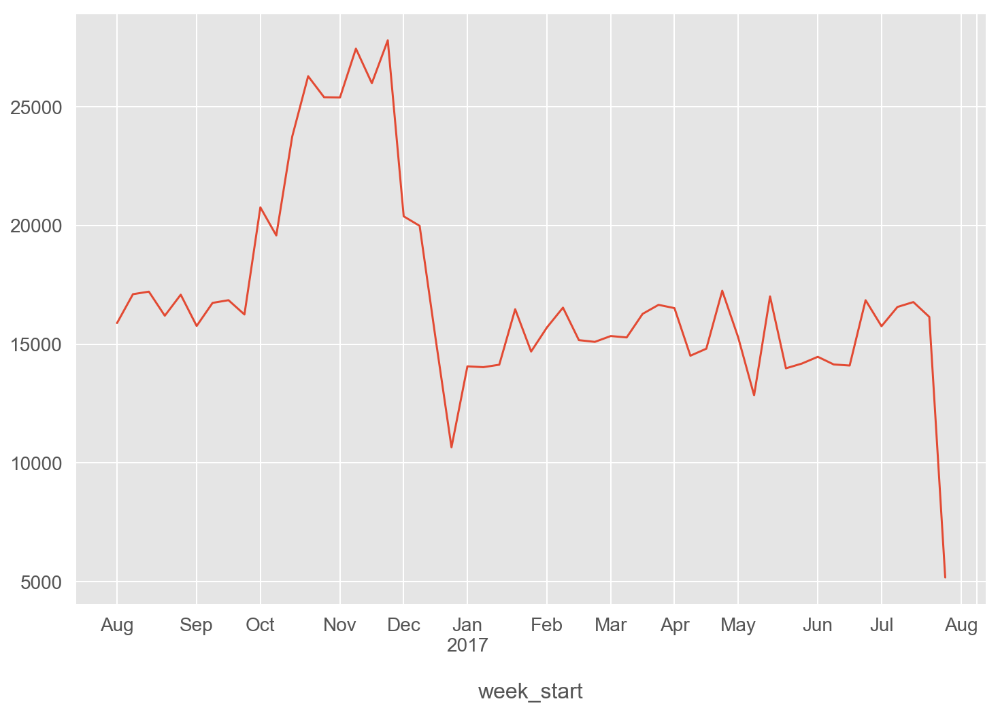

In [171]:
df.groupby('week_start').visits.sum().plot()

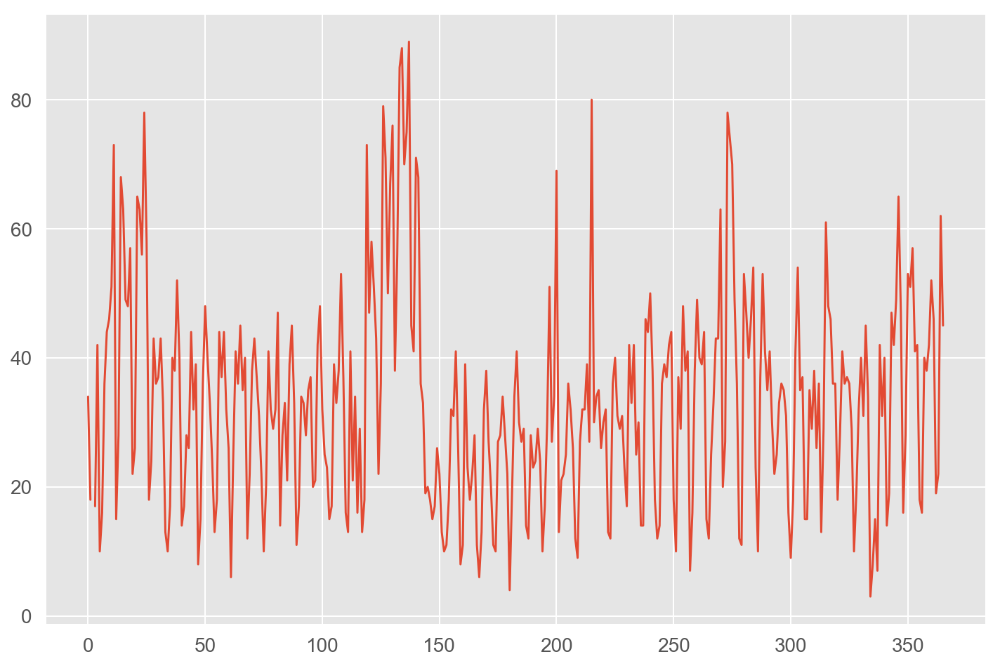

In [172]:
df.transactions.plot()

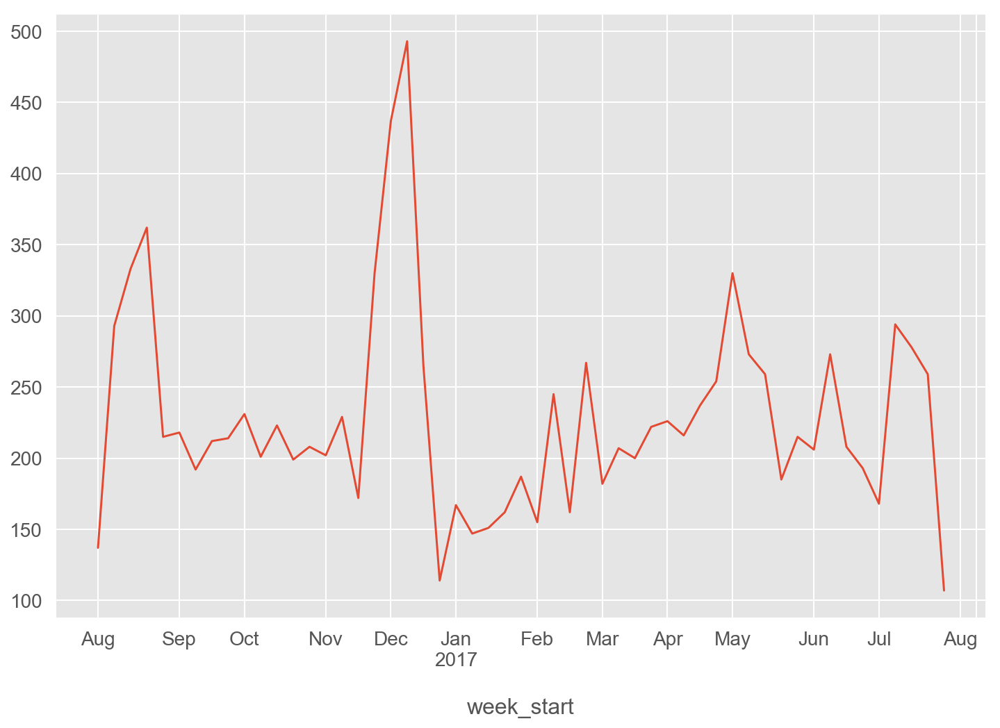

In [173]:
df.groupby('week_start').transactions.sum().plot()

We should throw out the first and last week (for these charts)

In [174]:
df_ = df[(df.week_start > df.week_start.min()) & (df.week_start < df.week_start.max())].copy()

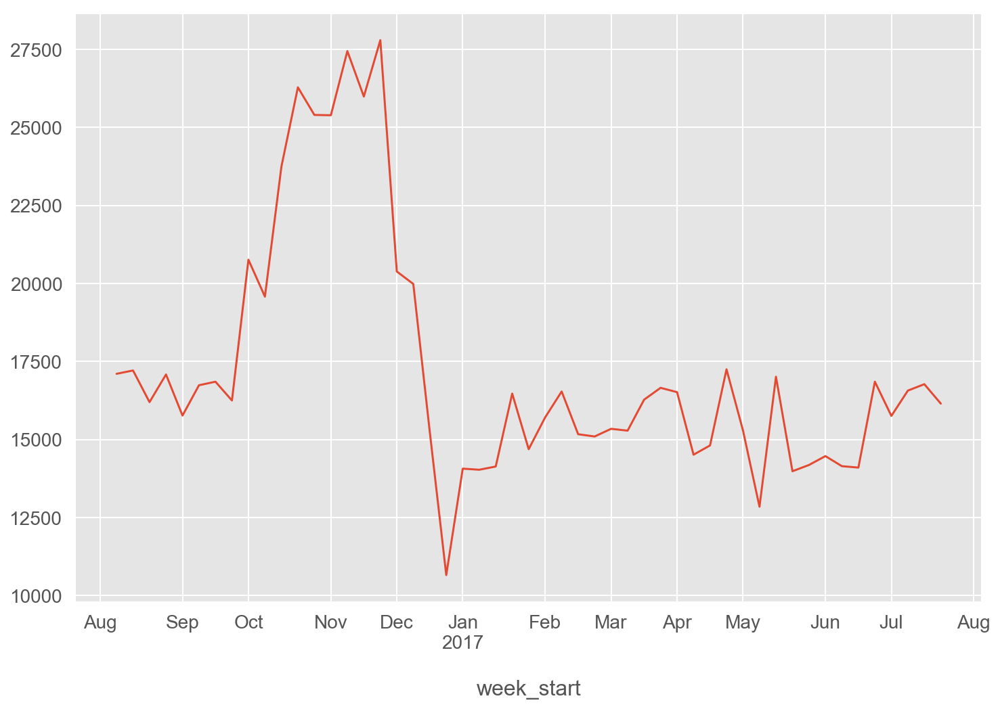

In [175]:
df_.groupby('week_start').visits.sum().plot()

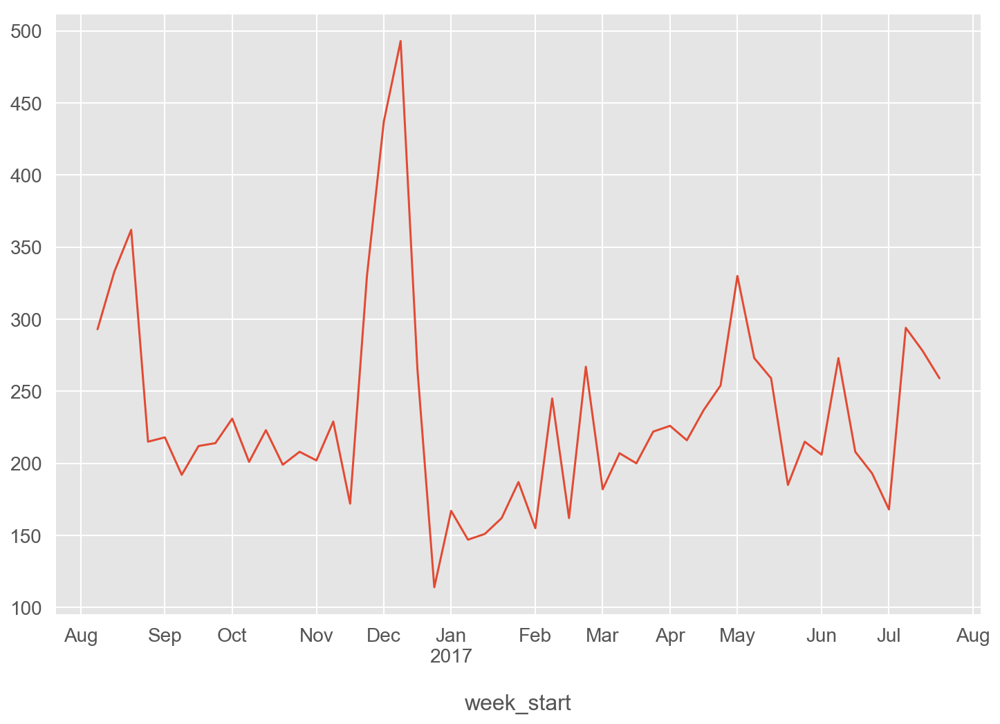

In [176]:
df_.groupby('week_start').transactions.sum().plot()

That's better!

## Forcasting with Facebook Prophet

In [177]:
from fbprophet import Prophet

### Transactions

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


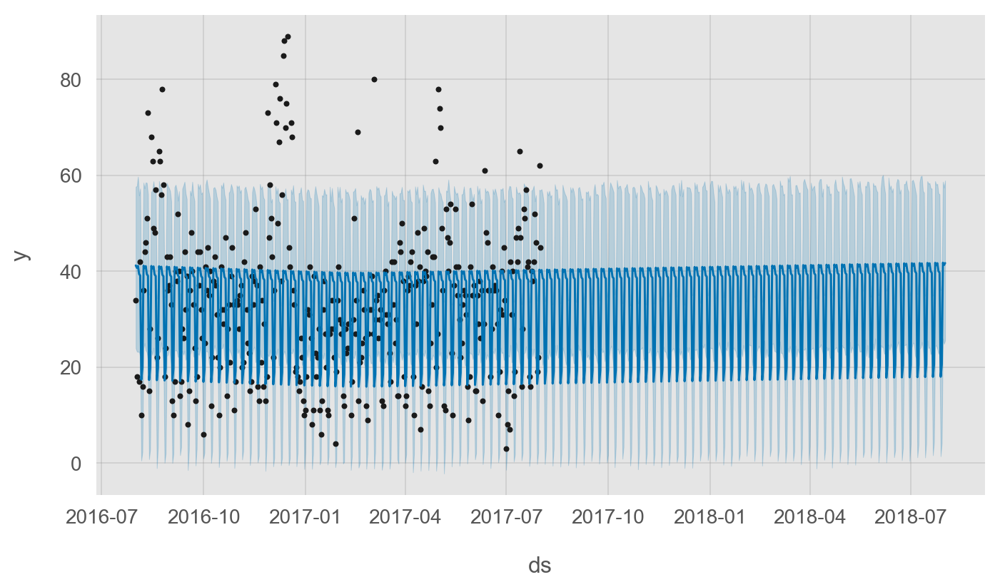

In [178]:
df_prophet = df[['date', 'transactions']]\
    .rename(columns={'date': 'ds', 'transactions': 'y'})
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet()
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

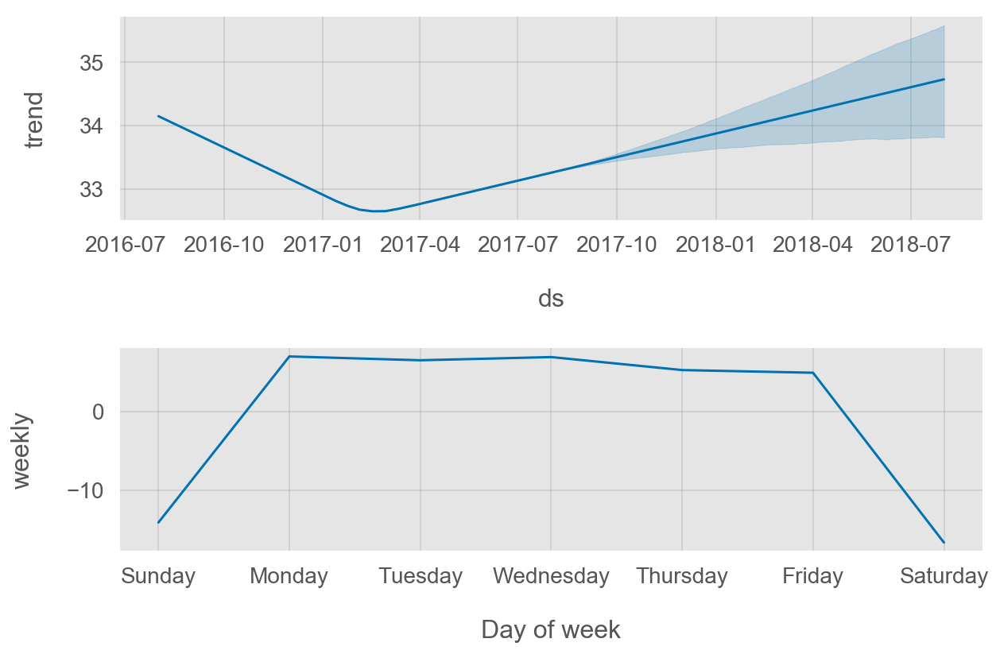

In [179]:
fig2 = m.plot_components(forecast)

Trying to fit the data better

In [180]:
Prophet?

Weekly seasonality

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


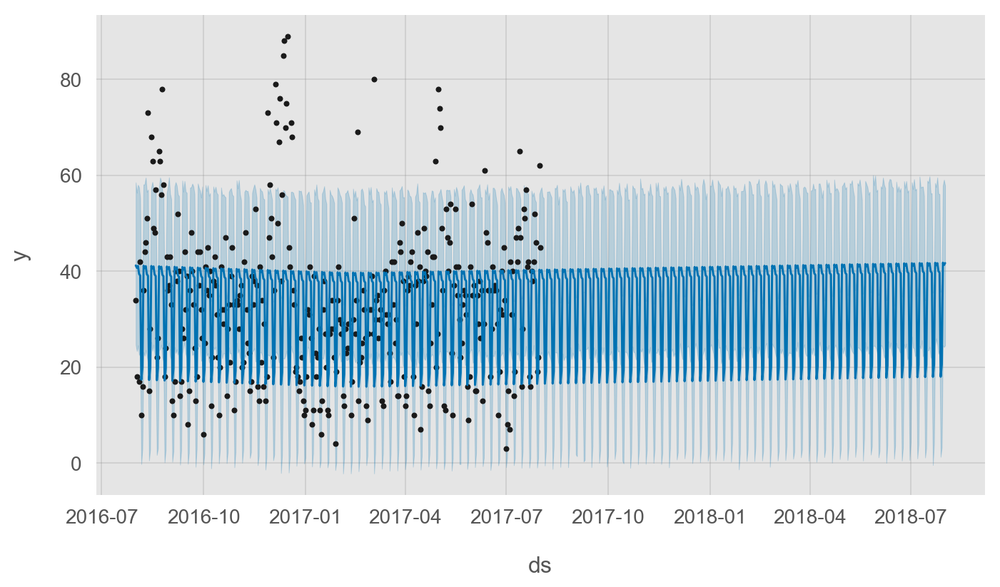

In [181]:
df_prophet = df[['date', 'transactions']]\
    .rename(columns={'date': 'ds', 'transactions': 'y'})
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

Tuning `changepoint_prior_scale`

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


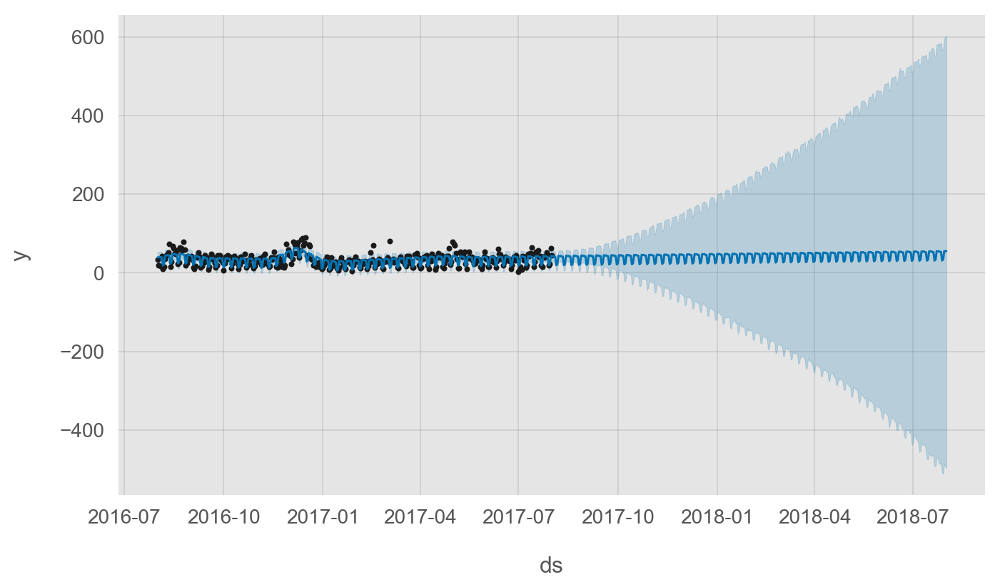

In [182]:
df_prophet = df[['date', 'transactions']]\
    .rename(columns={'date': 'ds', 'transactions': 'y'})
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True, changepoint_prior_scale=1)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


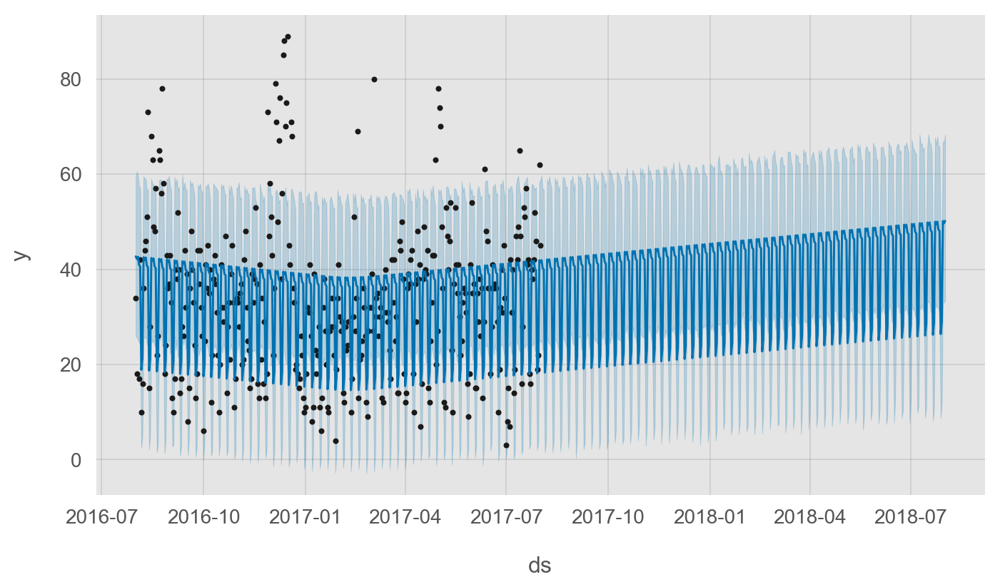

In [183]:
df_prophet = df[['date', 'transactions']]\
    .rename(columns={'date': 'ds', 'transactions': 'y'})
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True, changepoint_prior_scale=.1)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


(0, 100)

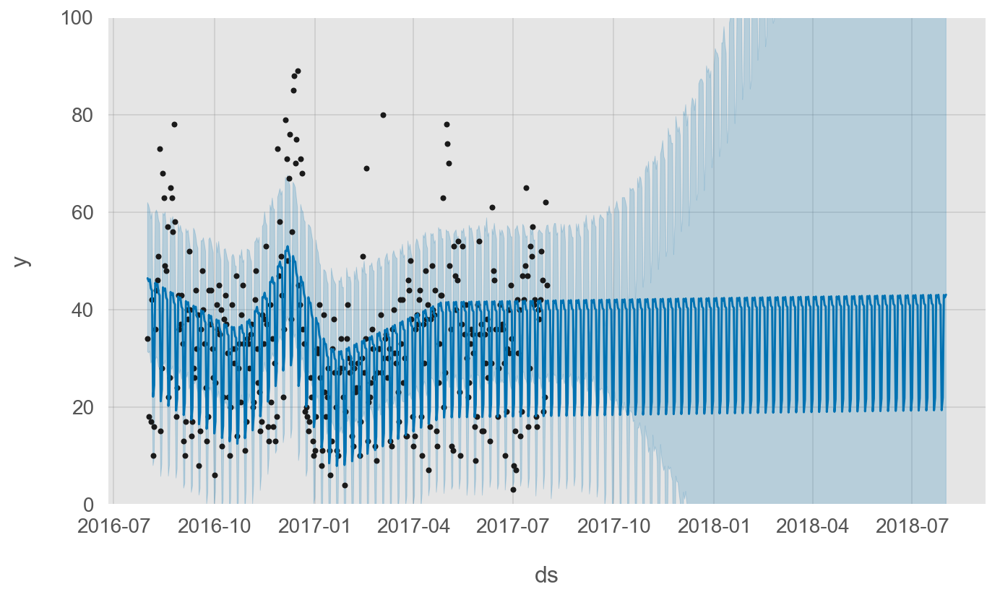

In [184]:
df_prophet = df[['date', 'transactions']]\
    .rename(columns={'date': 'ds', 'transactions': 'y'})
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True, changepoint_prior_scale=.5)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

plt.ylim(0, 100)

Trying out `daily_seasonality`

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


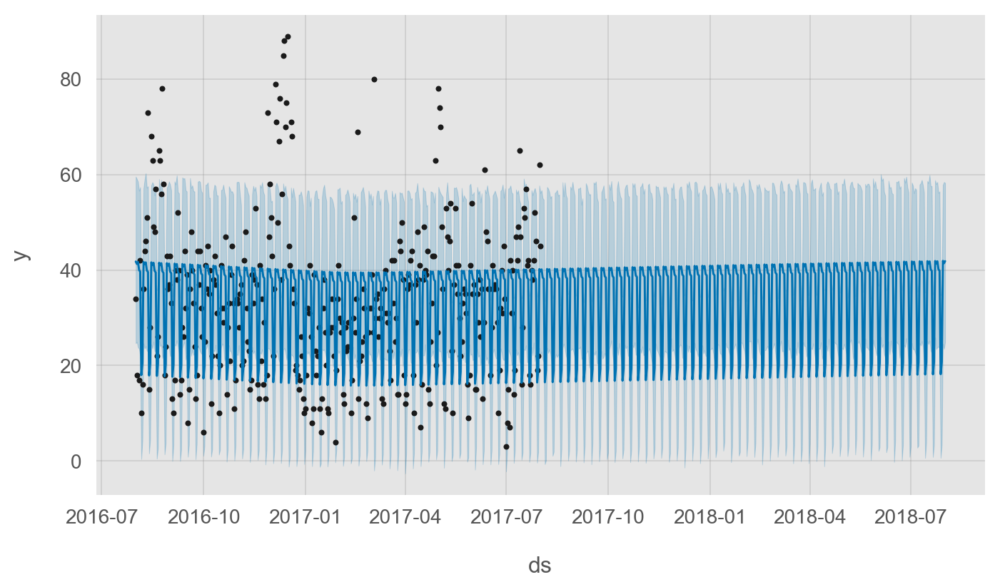

In [205]:
df_prophet = df[['date', 'transactions']]\
    .rename(columns={'date': 'ds', 'transactions': 'y'})
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(daily_seasonality=True, weekly_seasonality=True)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

This looks better! The trick is to add `yearly_seasonality`

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


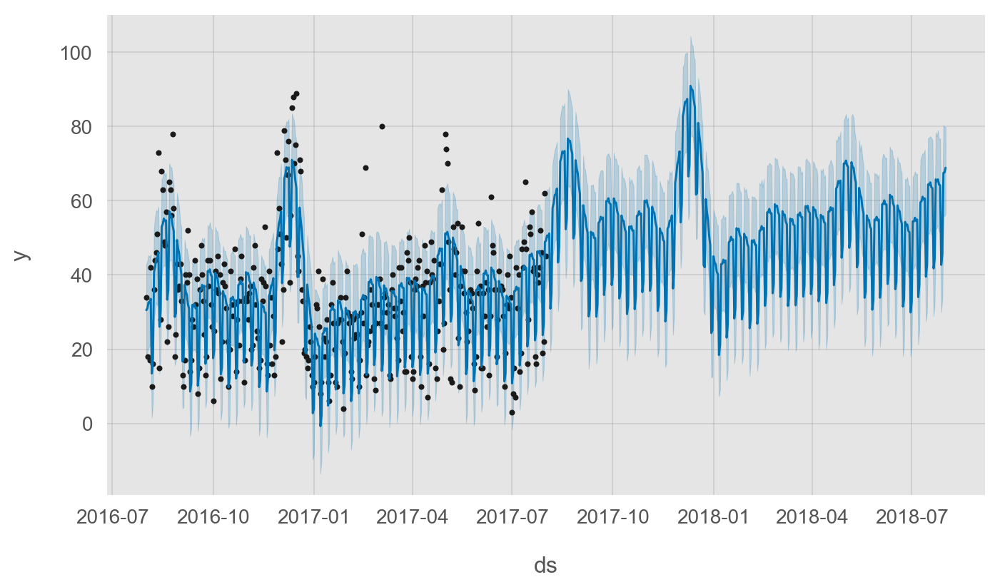

In [185]:
df_prophet = df[['date', 'transactions']]\
    .rename(columns={'date': 'ds', 'transactions': 'y'})
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True, yearly_seasonality=True)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

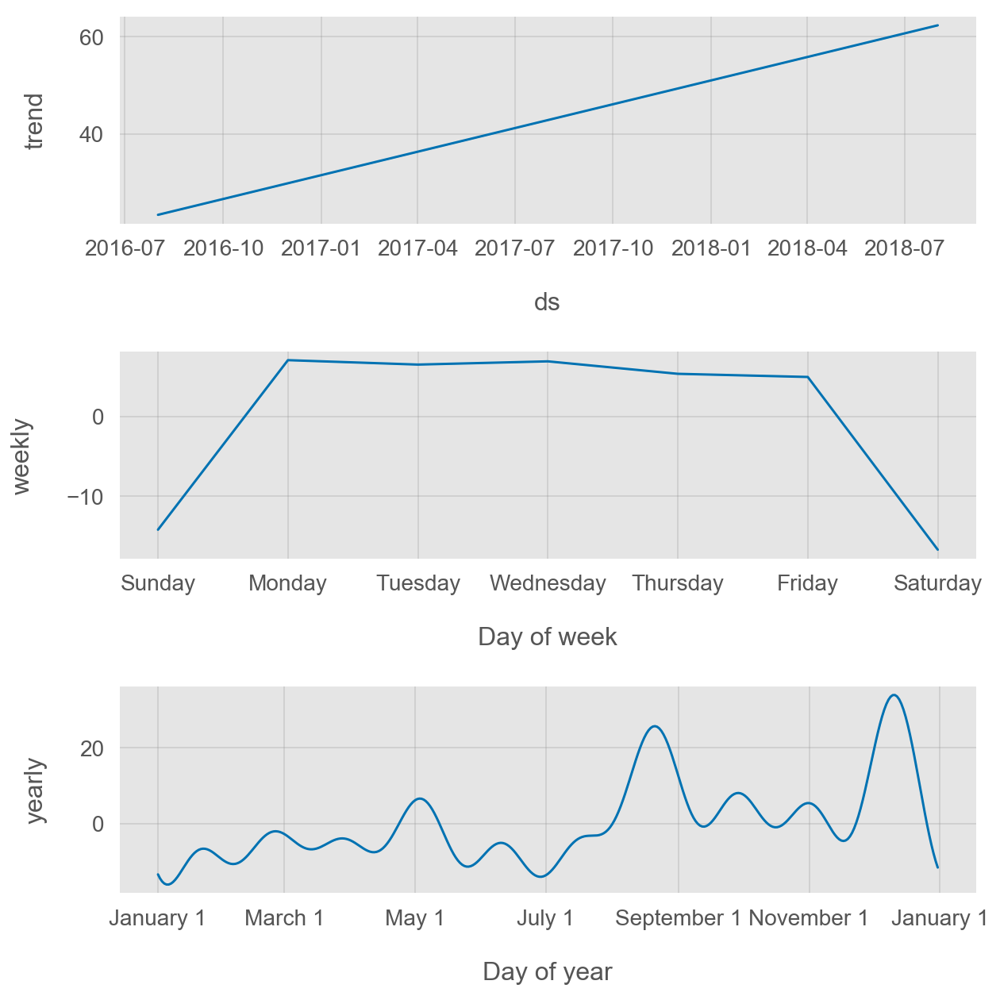

In [186]:
fig2 = m.plot_components(forecast)

In [191]:
Prophet?

`n_changepoints`

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


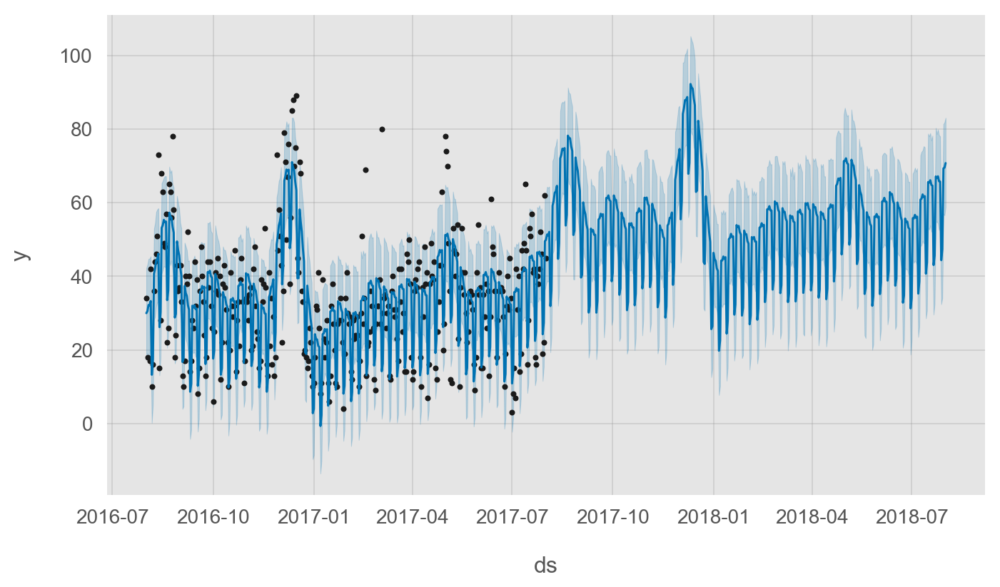

In [194]:
df_prophet = df[['date', 'transactions']]\
    .rename(columns={'date': 'ds', 'transactions': 'y'})
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True, yearly_seasonality=True, n_changepoints=2)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


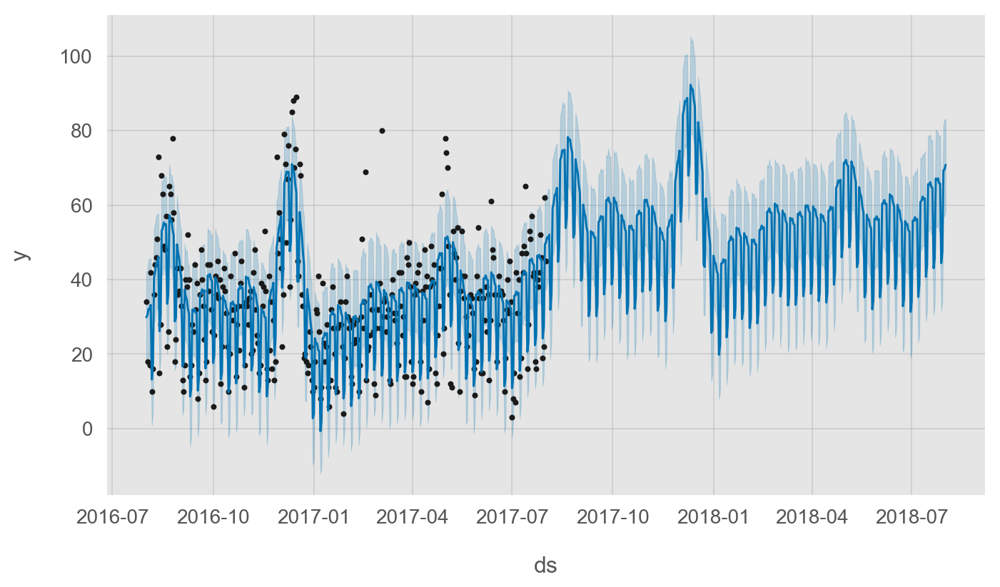

In [202]:
df_prophet = df[['date', 'transactions']]\
    .rename(columns={'date': 'ds', 'transactions': 'y'})
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True, yearly_seasonality=True, n_changepoints=0)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

`seasonality_prior_scale`

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


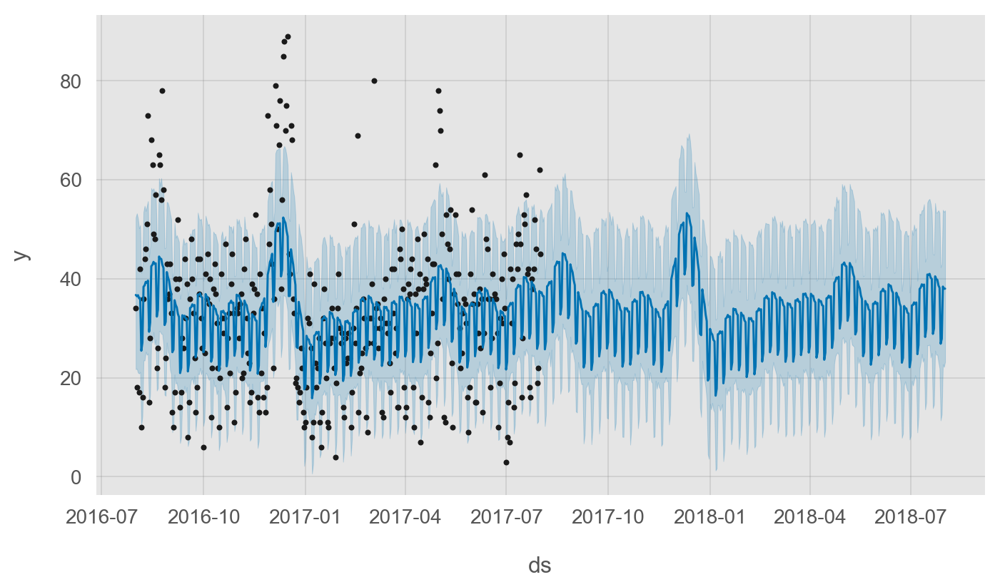

In [197]:
df_prophet = df[['date', 'transactions']]\
    .rename(columns={'date': 'ds', 'transactions': 'y'})
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True, yearly_seasonality=True, seasonality_prior_scale=0.01)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


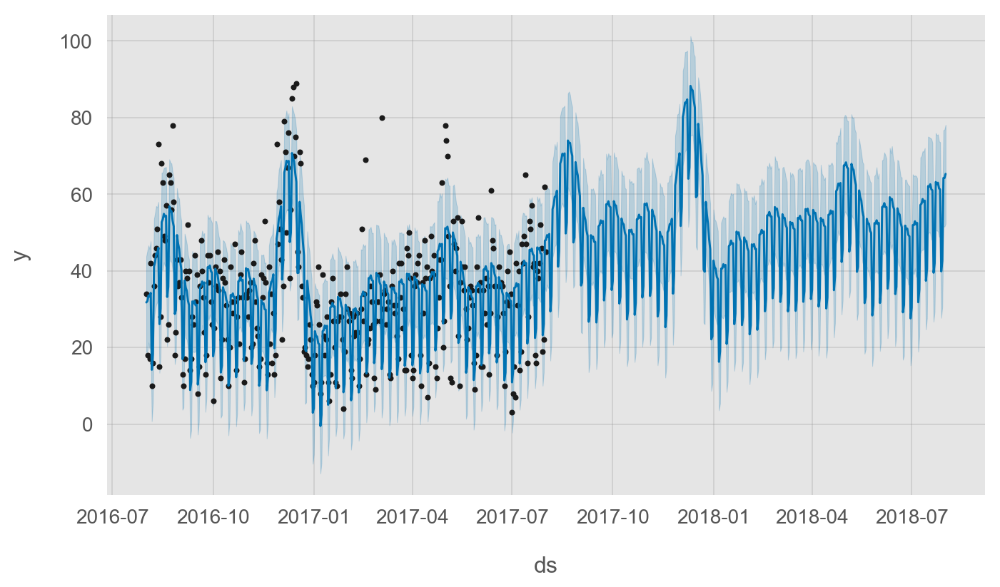

In [204]:
df_prophet = df[['date', 'transactions']]\
    .rename(columns={'date': 'ds', 'transactions': 'y'})
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True, yearly_seasonality=True, daily_seasonality=False, seasonality_prior_scale=0.1)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

### Sales

/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


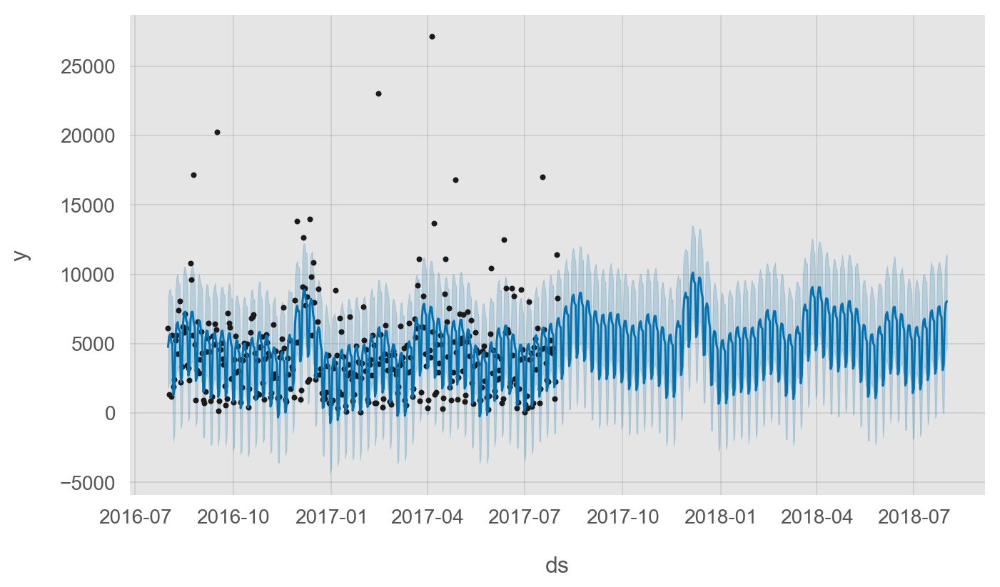

In [207]:
df_prophet = df[['date', 'transactionRevenue']]\
    .rename(columns={'date': 'ds', 'transactionRevenue': 'y'})
df_prophet['y'] = df_prophet['y'] / 1e6
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True,
            yearly_seasonality=True,
            daily_seasonality=False,
            seasonality_prior_scale=0.1)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

Here we give more weight to the yearly seasonality prior, but it predicts too aggrestive growth for me

/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


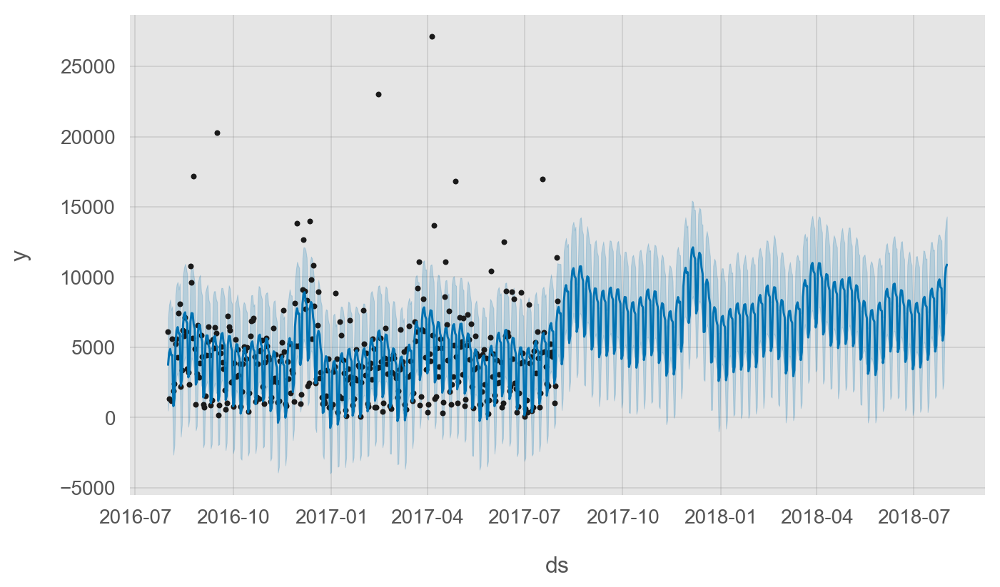

In [208]:
df_prophet = df[['date', 'transactionRevenue']]\
    .rename(columns={'date': 'ds', 'transactionRevenue': 'y'})
df_prophet['y'] = df_prophet['y'] / 1e6
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True,
            yearly_seasonality=True,
            daily_seasonality=False,
            seasonality_prior_scale=1)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)
fig1 = m.plot(forecast)

### Predictions by quarter

In [251]:
df_prophet = df[['date', 'transactions']]\
    .rename(columns={'date': 'ds', 'transactions': 'y'})
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True, yearly_seasonality=True, daily_seasonality=False, seasonality_prior_scale=0.1)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)

/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


In [252]:
forecast['date'] = pd.to_datetime(forecast['ds'])

In [253]:
def add_quarters(df):
    df['quarter'] = float('nan')
    df['quarter_num'] = float('nan')
    
    df.loc[(df.date >= datetime.datetime(2016, 7, 1))&(df.date < datetime.datetime(2016, 10, 1)), 'quarter'] = '2016 Q3'
    df.loc[(df.date >= datetime.datetime(2016, 10, 1))&(df.date < datetime.datetime(2017, 1, 1)), 'quarter'] = '2016 Q4'
    df.loc[(df.date >= datetime.datetime(2017, 1, 1))&(df.date < datetime.datetime(2017, 4, 1)), 'quarter'] = '2017 Q1'
    df.loc[(df.date >= datetime.datetime(2017, 4, 1))&(df.date < datetime.datetime(2017, 7, 1)), 'quarter'] = '2017 Q2'
    df.loc[(df.date >= datetime.datetime(2017, 7, 1))&(df.date < datetime.datetime(2017, 10, 1)), 'quarter'] = '2017 Q3'
    df.loc[(df.date >= datetime.datetime(2017, 10, 1))&(df.date < datetime.datetime(2018, 1, 1)), 'quarter'] = '2017 Q4'
    df.loc[(df.date >= datetime.datetime(2018, 1, 1))&(df.date < datetime.datetime(2018, 4, 1)), 'quarter'] = '2018 Q1'
    df.loc[(df.date >= datetime.datetime(2018, 4, 1))&(df.date < datetime.datetime(2018, 7, 1)), 'quarter'] = '2018 Q2'
    df.loc[(df.date >= datetime.datetime(2018, 7, 1))&(df.date < datetime.datetime(2018, 10, 1)), 'quarter'] = '2018 Q3'
    df.loc[(df.date >= datetime.datetime(2018, 10, 1))&(df.date < datetime.datetime(2019, 1, 1)), 'quarter'] = '2018 Q4'

    df.loc[(df.date >= datetime.datetime(2016, 7, 1))&(df.date < datetime.datetime(2016, 10, 1)), 'quarter_num'] = 1
    df.loc[(df.date >= datetime.datetime(2016, 10, 1))&(df.date < datetime.datetime(2017, 1, 1)), 'quarter_num'] = 2
    df.loc[(df.date >= datetime.datetime(2017, 1, 1))&(df.date < datetime.datetime(2017, 4, 1)), 'quarter_num'] = 3
    df.loc[(df.date >= datetime.datetime(2017, 4, 1))&(df.date < datetime.datetime(2017, 7, 1)), 'quarter_num'] = 4
    df.loc[(df.date >= datetime.datetime(2017, 7, 1))&(df.date < datetime.datetime(2017, 10, 1)), 'quarter_num'] = 5
    df.loc[(df.date >= datetime.datetime(2017, 10, 1))&(df.date < datetime.datetime(2018, 1, 1)), 'quarter_num'] = 6
    df.loc[(df.date >= datetime.datetime(2018, 1, 1))&(df.date < datetime.datetime(2018, 4, 1)), 'quarter_num'] = 7
    df.loc[(df.date >= datetime.datetime(2018, 4, 1))&(df.date < datetime.datetime(2018, 7, 1)), 'quarter_num'] = 8
    df.loc[(df.date >= datetime.datetime(2018, 7, 1))&(df.date < datetime.datetime(2018, 10, 1)), 'quarter_num'] = 9
    df.loc[(df.date >= datetime.datetime(2018, 10, 1))&(df.date < datetime.datetime(2019, 1, 1)), 'quarter_num'] = 10
    return df

In [254]:
forecast = add_quarters(forecast)

In [255]:
forecast.quarter.value_counts()

2017 Q3    92
2017 Q4    92
2016 Q4    92
2018 Q2    91
2017 Q2    91
2018 Q1    90
2017 Q1    90
2016 Q3    61
2018 Q3    32
Name: quarter, dtype: int64

We only have partial data for 2016 & 2018 Q3, so we'll want to filter these out

In [256]:
m = (forecast.quarter != '2016 Q3') & (forecast.quarter != '2018 Q3')
s_transactions = (
    forecast[m].groupby(['quarter_num', 'quarter'])
        .yhat.sum().reset_index()
        .set_index('quarter_num').sort_index(ascending=True)
        .set_index('quarter')['yhat']
)
s_transactions.apply(lambda x: '{:,}'.format(round(x)))

quarter
2016 Q4    3,354
2017 Q1    2,404
2017 Q2    3,054
2017 Q3    4,300
2017 Q4    4,930
2018 Q1    3,934
2018 Q2    4,608
Name: yhat, dtype: object

In [257]:
df_prophet = df[['date', 'transactionRevenue']]\
    .rename(columns={'date': 'ds', 'transactionRevenue': 'y'})
df_prophet['y'] = df_prophet['y'] / 1e6
df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

m = Prophet(weekly_seasonality=True,
            yearly_seasonality=True,
            daily_seasonality=False,
            seasonality_prior_scale=0.1)
m.fit(df_prophet)

future = m.make_future_dataframe(periods=365, freq='D')
forecast = m.predict(future)

forecast['date'] = pd.to_datetime(forecast['ds'])
forecast = add_quarters(forecast)

m = (forecast.quarter != '2016 Q3') & (forecast.quarter != '2018 Q3')
s_transactionRevenue = (
    forecast[m].groupby(['quarter_num', 'quarter'])
        .yhat.sum().reset_index()
        .set_index('quarter_num').sort_index(ascending=True)
        .set_index('quarter')['yhat']
)
s_transactionRevenue.apply(lambda x: '${:,}'.format(round(x)))

/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


quarter
2016 Q4    $389,013
2017 Q1    $337,926
2017 Q2    $395,713
2017 Q3    $493,543
2017 Q4    $509,898
2018 Q1    $454,149
2018 Q2    $515,331
Name: yhat, dtype: object

Display these results in a dataframe

In [261]:
# Get the actual sales (as opposed to predicted above)

df = add_quarters(df)
m = (df.quarter != '2016 Q3') & (df.quarter != '2018 Q3')
s_actual_transactionRevenue = (
    df[m].groupby(['quarter_num', 'quarter'])
        .transactionRevenue.sum().reset_index()
        .set_index('quarter_num').sort_index(ascending=True)
        .set_index('quarter')['transactionRevenue'] / 1e6
)
m.apply(lambda x: '${:,}'.format(round(x)))

quarter
2016 Q4    $386,901
2017 Q1    $337,599
2017 Q2    $402,070
2017 Q3    $132,804
Name: transactionRevenue, dtype: object

In [268]:
forecast_results = pd.DataFrame({
    'Reporting Period': ['Q4', 'Q1', 'Q2'],
    'Prev Year': [386901, 337599, 402070],
    'Forecasted': [509898, 454149, 515331],
})
forecast_results['YoY (%)'] = ((forecast_results['Forecasted'] - forecast_results['Prev Year'])
                                / forecast_results['Prev Year'] * 100).apply(lambda x: '{:+.0f}%'.format(x))
forecast_results['Prev Year'] = forecast_results['Prev Year'].apply(lambda x: '{:,}'.format(x))
forecast_results['Forecasted'] = forecast_results['Forecasted'].apply(lambda x: '{:,}'.format(x))
forecast_results.set_index('Reporting Period', inplace=True)
forecast_results.to_csv('../../data/interim/sales_forecast.csv')

In [269]:
forecast_results

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"386,901","509,898",+32%
Q1,"337,599","454,149",+35%
Q2,"402,070","515,331",+28%


## Forecasting by product

Looking a couple samples...

In [286]:
def search():
    data = []
    i = 0
    for f_name in glob.glob('../../data/raw/*.jsonl'):
        print('scanning {}'.format(f_name))
        with open(f_name, 'r') as f:
            for line in tqdm_notebook(f.readlines()):
                i += 1
                d = json.loads(line.strip())
                if d['totals']['transactions']:
                    data.append(d)
                    return data

print(json.dumps(search()))

# with open('/tmp/temp.json', 'w') as f:
#     json.dump(data, f)

scanning ../../data/raw/ga_sessions_20160801.jsonl



[{"visitorId": null, "visitNumber": 1, "visitId": 1470106850, "visitStartTime": 1470106850, "date": "20160801", "totals": {"visits": 1, "hits": 16, "pageviews": 13, "timeOnSite": 571, "bounces": null, "transactions": 1, "transactionRevenue": 16990000, "newVisits": 1, "screenviews": null, "uniqueScreenviews": null, "timeOnScreen": null, "totalTransactionRevenue": 23990000, "sessionQualityDim": null}, "trafficSource": {"referralPath": "/yt/about/", "campaign": "(not set)", "source": "youtube.com", "medium": "referral", "keyword": null, "adContent": null, "adwordsClickInfo": {"campaignId": null, "adGroupId": null, "creativeId": null, "criteriaId": null, "page": null, "slot": null, "criteriaParameters": "not available in demo dataset", "gclId": null, "customerId": null, "adNetworkType": null, "targetingCriteria": null, "isVideoAd": null}, "isTrueDirect": null, "campaignCode": null}, "device": {"browser": "Safari", "browserVersion": "not available in demo dataset", "browserSize": "not avai

### Read from `jsonl` local

In [304]:
from typing import List, Tuple, Dict

In [305]:
%%time
"""
Using local jsonl
"""
ERRORS = []

def pull_daily_product_sales(
    verbose=False,
    raise_errors=False,
    test=False,
) -> Tuple[pd.DataFrame, dict]:
    dataset = sorted(glob.glob('../../data/raw/*.jsonl'))

    data = []
    for table in tqdm_notebook(dataset):
        if verbose:
            print('Scanning {}'.format(table))
        with open(table, 'r') as f:
            for line in f:
                d = json.loads(line)
                try:
                    if not d['totals']['transactions']:
                        # No purchases, continue to next visitor
                        continue
                    for hit in d['hits']:
                        for product in hit['product']:
                            if product['productRevenue']:
                                data.append({
                                    'date': d['date'],
                                    'visitId': d['visitId'],
                                    'fullVisitorId': d['fullVisitorId'],
                                    'product': product,
                                })
                except Exception as e:
                    if verbose:
                        print('Error raised when reading row:\n{}'.format(e))
                    ERRORS.append([table, e])
                    if raise_errors:
                        raise(e)
                        
        if test and (table == dataset[1]):
            break

    cols_main = ['date', 'visitId', 'fullVisitorId']
    cols_product = [
        'productSKU', 'v2ProductName', 'v2ProductCategory', 'productVariant',
        'productRevenue', 'productQuantity', 'productRefundAmount'
    ]
    df_data = [
        [d.get(col, float('nan')) for col in cols_main]
        + [d['product'].get(col) for col in cols_product]
        for d in data
    ]
    df = pd.DataFrame(df_data, columns=(cols_main+cols_product))
    return df, data

jsonl_product_results, nosql_data = pull_daily_product_sales(raise_errors=True, test=True)


CPU times: user 2.74 s, sys: 105 ms, total: 2.84 s
Wall time: 2.91 s


In [306]:
jsonl_product_results, nosql_data = pull_daily_product_sales()

In [307]:
df = jsonl_product_results.copy()
df.date = pd.to_datetime(df.date)
df.to_csv('../../data/interim/product_sales_forecast_raw.csv', index=False)

In [308]:
def load_file(f_path):
    if not os.path.exists(f_path):
        print('No data found. Run data load script above.')
        return
    print('Loading {}'.format(f_path))
    df = pd.read_csv(f_path)
    df.date = pd.to_datetime(df.date)
    return df

tmp = load_file('../../data/interim/product_sales_forecast_raw.csv')
if tmp is not None:
    print('Loading from file')
    df = tmp.copy()
    del tmp

Loading ../../data/interim/product_sales_forecast_raw.csv
Loading from file


In [309]:
df.head()

,date,visitId,fullVisitorId,productSKU,v2ProductName,productVariant,productRevenue,productQuantity,productRefundAmount
0,2016-08-01,1470106850,4993485206334150199,GGOEYAAQ031714,YouTube Men's Short Sleeve Hero Tee White,MD,23990000,1,NaN
1,2016-08-01,1470084579,3907770685196037697,GGOEYDHJ019399,24 oz YouTube Sergeant Stripe Bottle,Single Option Only,12990000,1,NaN
2,2016-08-01,1470069291,7056870819058799369,GGOEGAAQ010417,Google Men's 100% Cotton Short Sleeve Hero Tee...,2XL,22590000,1,NaN
3,2016-08-01,1470096817,6030957980134486247,GGOEYAEB028413,Women's YouTube Short Sleeve Hero Tee Black,SM,19990000,1,NaN
4,2016-08-01,1470055898,6203401114057579951,GGOEGDHC018299,22 oz Mini Mountain Bottle,BLUE,36350000,15,NaN


### Read from bigquery

In [ ]:
%%time
"""
Using bigquery
"""

def pull_daily_product_sales(verbose=False):
    dataset = client.get_dataset('bigquery-public-data.google_analytics_sample')

    data = []
    for table in tqdm_notebook(list(client.list_tables(dataset))):
        if verbose:
            print('Querying {}'.format(table.table_id))
        query_job = client.query('''
        SELECT
            h.item.productName AS other_purchased_products,
            COUNT(h.item.productName) AS quantity
        FROM `bigquery-public-data.google_analytics_sample.{}`,
            UNNEST(hits) as h
        WHERE (
            fullVisitorId IN (
                SELECT fullVisitorId
                FROM `bigquery-public-data.google_analytics_sample.{}`,
                    UNNEST(hits) as h
                WHERE h.item.productName CONTAINS 'Product Item Name A'
                AND totals.transactions>=1
                GROUP BY fullVisitorId
            )
            AND h.item.productName IS NOT NULL
            AND h.item.productName != 'Product Item Name A'
        )
        GROUP BY other_purchased_products
        ORDER BY quantity DESC;
        '''.format(table.table_id, table.table_id))
        results = query_job.result().to_dataframe()
        results.columns = ['date', 'visits', 'pageviews', 'transactions', 'transactionRevenue']
        data.append(results)

    df = pd.concat(data, ignore_index=True, sort=False)
    return df

bq_results = pull_daily_product_sales()

In [ ]:
bq_results.head()

### Exploration

What's going on with refunds?

In [338]:
(~(df.productRefundAmount.isnull())).sum()

0

They are all null. That is good.

How many _different_ products are purchased together?

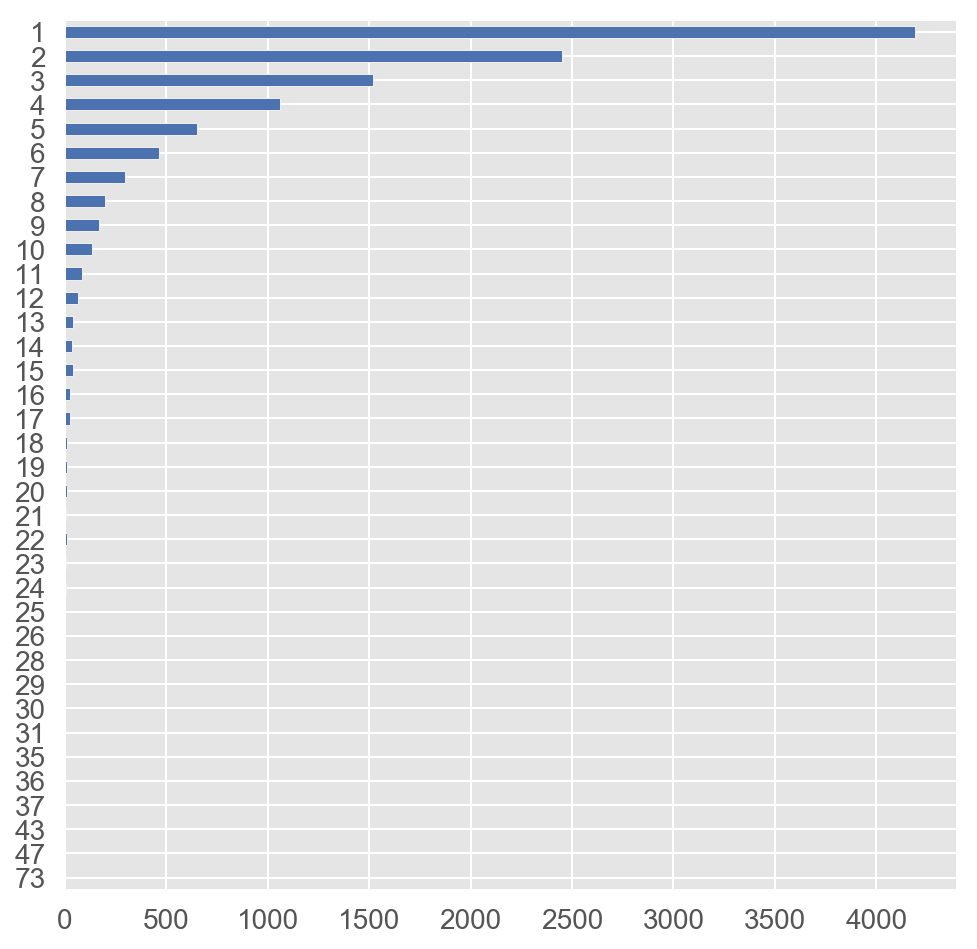

In [331]:
fig = plt.figure(figsize=(8, 8))
s = df.groupby('visitId').size().value_counts().sort_index(ascending=False)
s.plot.barh(color='b')


How are product quantities distributed?

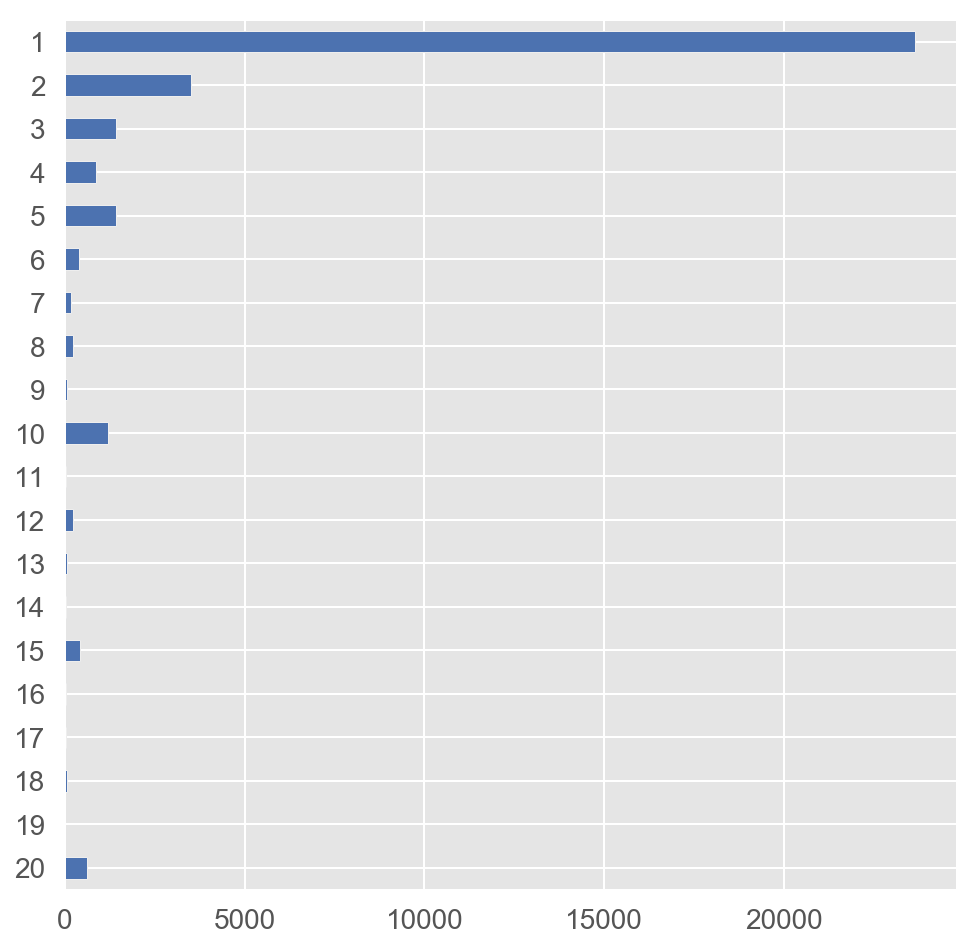

In [333]:
fig = plt.figure(figsize=(8, 8))
s = df.productQuantity.value_counts().sort_index(ascending=False).tail(20)
s.plot.barh(color='b')

Top selling products

In [337]:
df.v2ProductName.value_counts(ascending=False).head(10)

Google Sunglasses                                       1364
Google Laptop and Cell Phone Stickers                    788
Google 22 oz Water Bottle                                784
Google Men's 100% Cotton Short Sleeve Hero Tee White     760
Google Men's 100% Cotton Short Sleeve Hero Tee Black     715
Google Men's 100% Cotton Short Sleeve Hero Tee Navy      561
Google Men's  Zip Hoodie                                 468
Recycled Paper Journal Set                               431
BLM Sweatshirt                                           405
Engraved Ceramic Google Mug                              400
Name: v2ProductName, dtype: int64

Top grossing products

In [339]:
(df.groupby('v2ProductName').productRevenue.sum() / 1e6).sort_values(ascending=False).head(10)

v2ProductName
Google Men's  Zip Hoodie                                47636.271605
26 oz Double Wall Insulated Bottle                      44454.491527
Google 22 oz Water Bottle                               42995.041996
Leatherette Journal                                     38563.457656
Google Sunglasses                                       35490.321293
Google Metallic Notebook Set                            28846.596814
Google Men's 100% Cotton Short Sleeve Hero Tee Black    28047.612114
Recycled Paper Journal Set                              27918.170430
Google Men's 100% Cotton Short Sleeve Hero Tee White    27856.018891
Google Hard Cover Journal                               25432.673189
Name: productRevenue, dtype: float64

### Forecasts by product name

Daily forcasts are choppy... 

In [349]:
def product_forcast(df, product_name) -> pd.DataFrame:

    m = df.v2ProductName == product_name
    print('Found {} product transactions'.format(m.sum()))
    if m.sum() == 0:
        print('Returning empty DataFrame')
        return pd.DataFrame

    df_prophet = df[m][['date', 'productRevenue']]\
        .rename(columns={'date': 'ds', 'productRevenue': 'y'})
    df_prophet['y'] = df_prophet['y'] / 1e6
    df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

    m = Prophet(weekly_seasonality=True,
                yearly_seasonality=True,
                daily_seasonality=False,
                seasonality_prior_scale=0.01)
    m.fit(df_prophet)

    future = m.make_future_dataframe(periods=365, freq='D')
    forecast = m.predict(future)
    fig = m.plot(forecast)
    
    return forecast, fig

Found 468 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


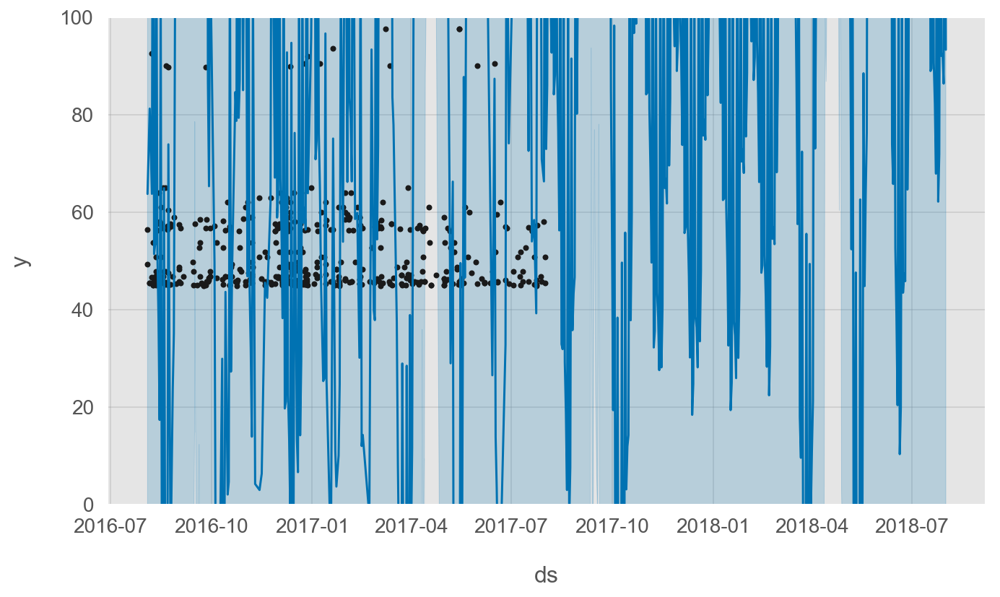

In [350]:
forecast, fig = product_forcast(df, 'Google Men\'s  Zip Hoodie')

plt.ylim(0, 100)
plt.show()

Weekly forcasts

In [351]:
def product_forcast(df, product_name) -> pd.DataFrame:

    m = df.v2ProductName == product_name
    print('Found {} product transactions'.format(m.sum()))
    if m.sum() == 0:
        print('Returning empty DataFrame')
        return pd.DataFrame

    df_prophet = df[m][['date', 'productRevenue']]\
        .rename(columns={'date': 'ds', 'productRevenue': 'y'})
    df_prophet['y'] = df_prophet['y'] / 1e6
    df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

    m = Prophet(weekly_seasonality=True,
                yearly_seasonality=True,
                daily_seasonality=False,
                seasonality_prior_scale=0.1)
    m.fit(df_prophet)

    future = m.make_future_dataframe(periods=52, freq='7D')
    forecast = m.predict(future)
    fig = m.plot(forecast)
    
    return forecast, fig

Found 468 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


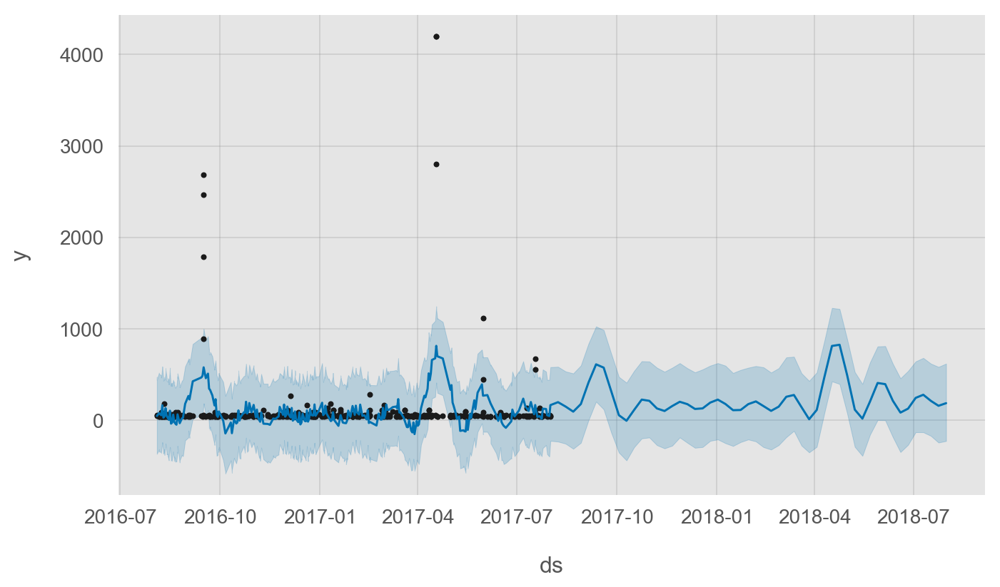

In [353]:
forecast, fig = product_forcast(df, 'Google Men\'s  Zip Hoodie')

plt.show()

Trying `seasonality_mode='multiplicative'`

In [355]:
def product_forcast(df, product_name) -> pd.DataFrame:

    m = df.v2ProductName == product_name
    print('Found {} product transactions'.format(m.sum()))
    if m.sum() == 0:
        print('Returning empty DataFrame')
        return pd.DataFrame

    df_prophet = df[m][['date', 'productRevenue']]\
        .rename(columns={'date': 'ds', 'productRevenue': 'y'})
    df_prophet['y'] = df_prophet['y'] / 1e6
    df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

    m = Prophet(seasonality_mode='multiplicative')
    m.fit(df_prophet)

    future = m.make_future_dataframe(periods=52, freq='7D')
    forecast = m.predict(future)
    fig = m.plot(forecast)
    
    return forecast, fig

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Found 468 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


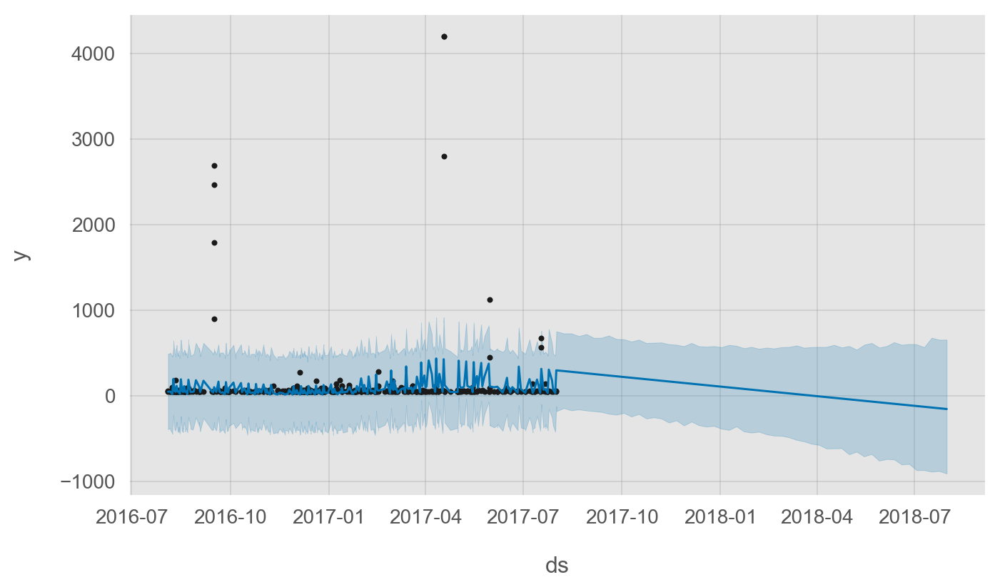

In [356]:
forecast, fig = product_forcast(df, 'Google Men\'s  Zip Hoodie')

plt.show()

No arguments...

In [359]:
def product_forcast(df, product_name) -> pd.DataFrame:

    m = df.v2ProductName == product_name
    print('Found {} product transactions'.format(m.sum()))
    if m.sum() == 0:
        print('Returning empty DataFrame')
        return pd.DataFrame

    df_prophet = df[m][['date', 'productRevenue']]\
        .rename(columns={'date': 'ds', 'productRevenue': 'y'})
    df_prophet['y'] = df_prophet['y'] / 1e6
    df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

    m = Prophet()
    m.fit(df_prophet)

    future = m.make_future_dataframe(periods=365, freq='D')
    forecast = m.predict(future)
    fig = m.plot(forecast)
    
    return forecast, fig

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Found 468 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


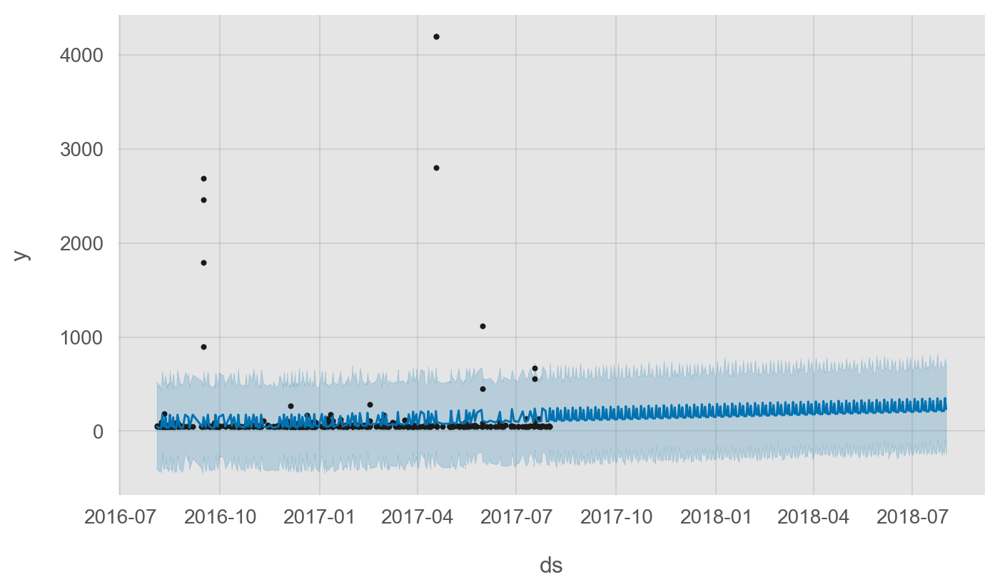

In [360]:
forecast, fig = product_forcast(df, 'Google Men\'s  Zip Hoodie')

plt.show()

Google sunglasses

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Found 1364 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


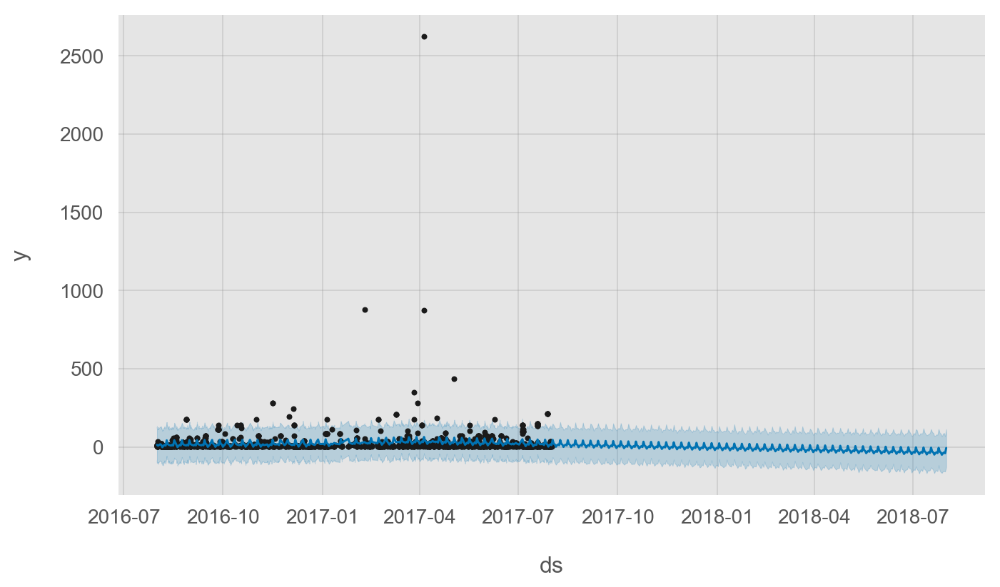

In [361]:
forecast, fig = product_forcast(df, 'Google Sunglasses')

plt.show()

In [362]:
def product_forcast(df, product_name) -> pd.DataFrame:

    m = df.v2ProductName == product_name
    print('Found {} product transactions'.format(m.sum()))
    if m.sum() == 0:
        print('Returning empty DataFrame')
        return pd.DataFrame

    df_prophet = df[m][['date', 'productRevenue']]\
        .rename(columns={'date': 'ds', 'productRevenue': 'y'})
    df_prophet['y'] = df_prophet['y'] / 1e6
    df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

    m = Prophet(seasonality_mode='multiplicative')
    m.fit(df_prophet)

    future = m.make_future_dataframe(periods=365, freq='D')
    forecast = m.predict(future)
    fig = m.plot(forecast)
    
    return forecast, fig

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Found 1364 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


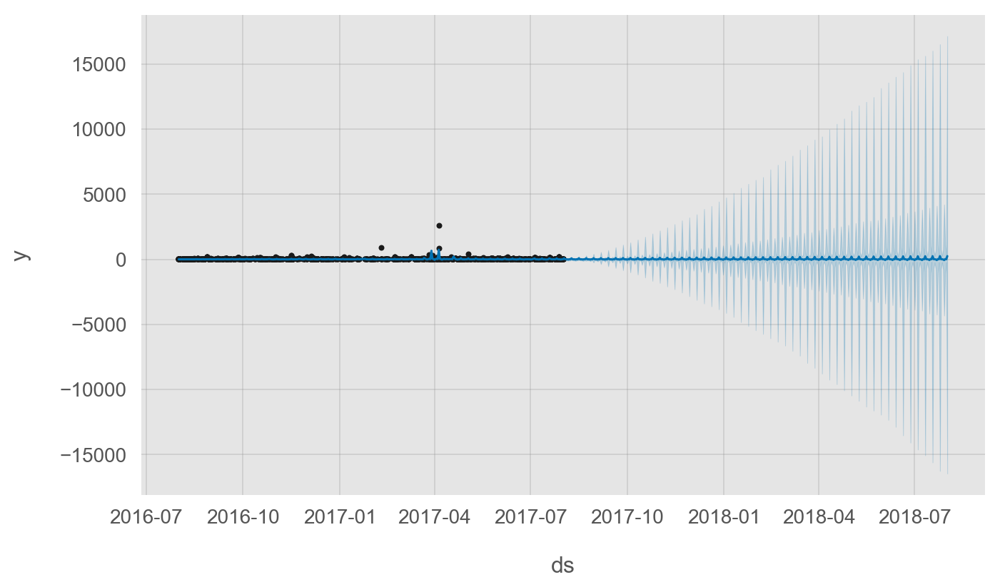

In [363]:
forecast, fig = product_forcast(df, 'Google Sunglasses')

plt.show()

In [366]:
def product_forcast(df, product_name) -> pd.DataFrame:

    m = df.v2ProductName == product_name
    print('Found {} product transactions'.format(m.sum()))
    if m.sum() == 0:
        print('Returning empty DataFrame')
        return pd.DataFrame

    df_prophet = df[m][['date', 'productRevenue']]\
        .rename(columns={'date': 'ds', 'productRevenue': 'y'})
    df_prophet['y'] = df_prophet['y'] / 1e6
    df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

    m = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
    m.fit(df_prophet)

    future = m.make_future_dataframe(periods=365, freq='D')
    forecast = m.predict(future)
    fig = m.plot(forecast)
    
    return forecast, fig

Found 1364 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


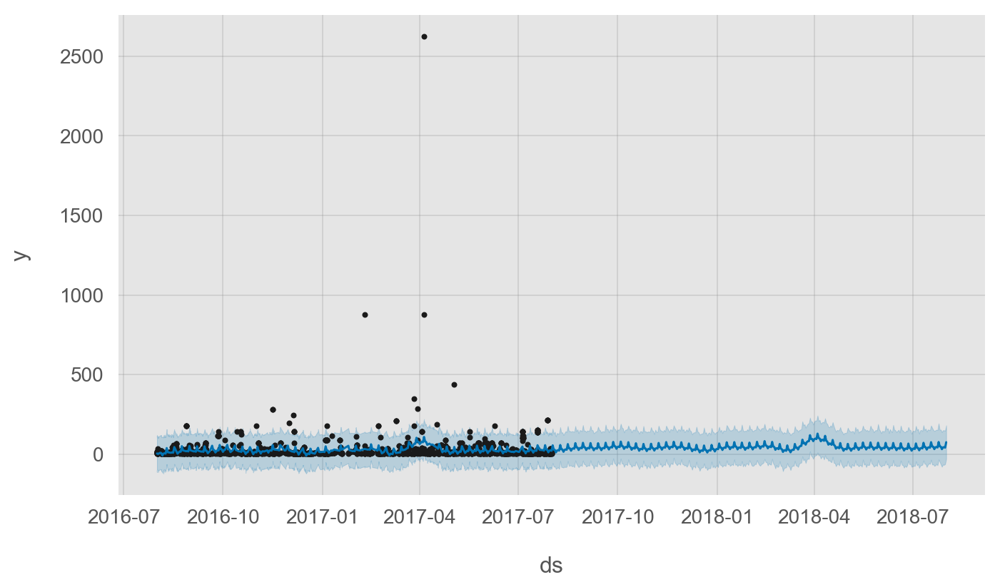

In [367]:
forecast, fig = product_forcast(df, 'Google Sunglasses')
plt.show()

Found 468 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


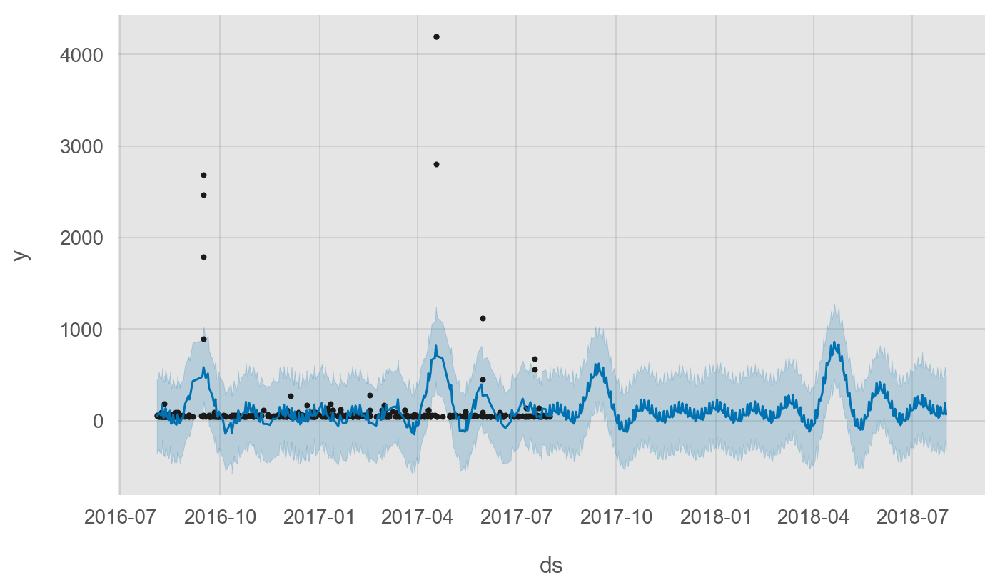

In [368]:
forecast, fig = product_forcast(df, 'Google Men\'s  Zip Hoodie')
plt.show()

Clearly there was some crazy stuff going on with the hoodies for a few days. It may not be possilbe to predict this kind of event.

I am going to remove these outliers (by computing standard deviation and filtering out e.g. `>3s.d.`). Then I'll take that missing revenue and add it back into the quarterly predictions, splitting evenly.

In [431]:
def product_forcast(
    df,
    product_name,
    ignore_std=0,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
) -> pd.DataFrame:

    m = df.v2ProductName == product_name
    if ignore_std:
        len_0 = m.sum()
        m_outliers = df.productRevenue < (df.loc[m, 'productRevenue'].mean() + df.loc[m, 'productRevenue'].std()*ignore_std)
        print('Ignoring {} outlier points'.format(len_0 - m.sum()))
        
    print('Found {} product transactions'.format(m.sum()))
    if m.sum() == 0:
        print('Returning empty DataFrame')
        return pd.DataFrame

    df_prophet = df[m][['date', 'productRevenue']]\
        .rename(columns={'date': 'ds', 'productRevenue': 'y'})
    df_prophet['y'] = df_prophet['y'] / 1e6
    df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

    m = Prophet(yearly_seasonality=yearly_seasonality,
                weekly_seasonality=weekly_seasonality,
                daily_seasonality=daily_seasonality)
    m.fit(df_prophet)

    future = m.make_future_dataframe(periods=365, freq='D')
    forecast = m.predict(future)
    fig = m.plot(forecast)
    
    return forecast, fig

Ignoring 0 outlier points
Found 1364 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


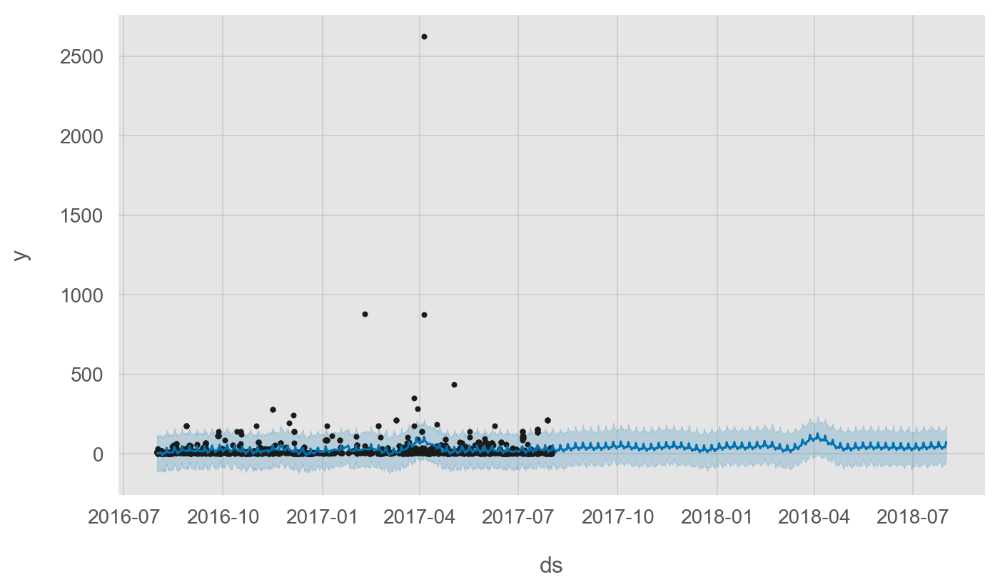

In [432]:
forecast, fig = product_forcast(df, 'Google Sunglasses', ignore_std=1)
plt.show()

Ignoring 0 outlier points
Found 468 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


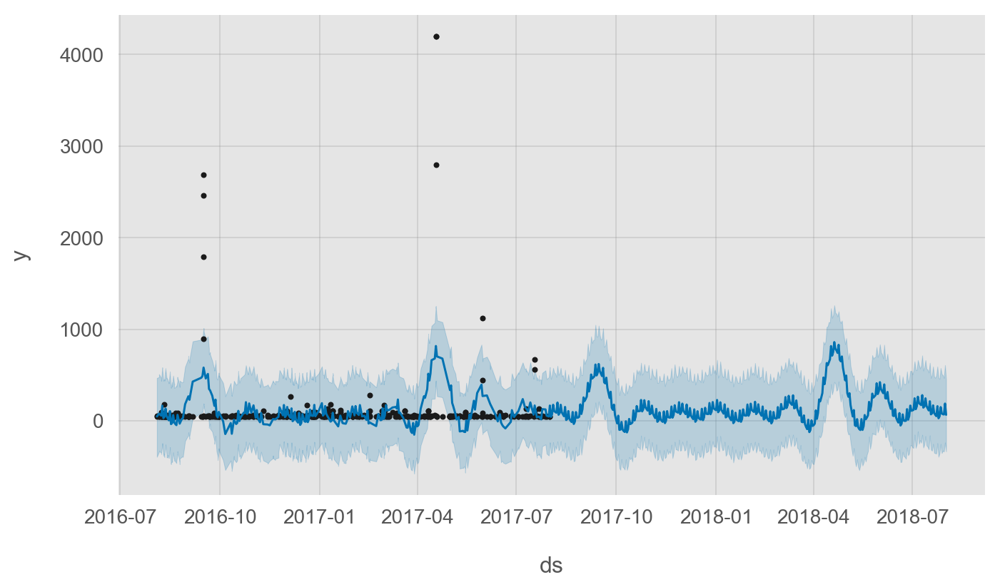

In [433]:
forecast, fig = product_forcast(df, 'Google Men\'s  Zip Hoodie', ignore_std=1)
plt.show()

Weekly seasonality

Ignoring 0 outlier points
Found 468 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


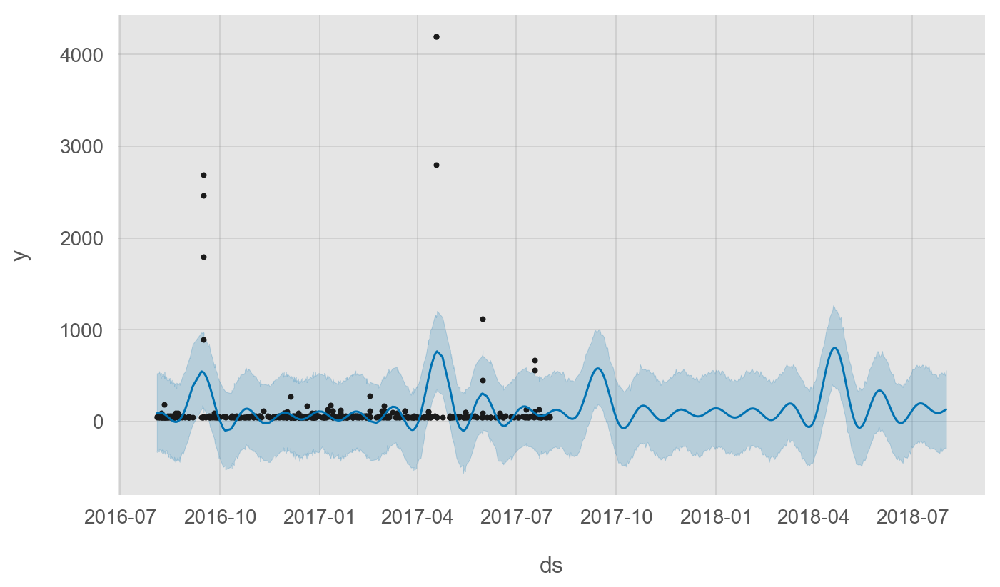

In [434]:
forecast, fig = product_forcast(df, 'Google Men\'s  Zip Hoodie', ignore_std=1, weekly_seasonality=False)
plt.show()

Making forecasts by quarter

In [435]:
def add_quarters(df):
    df['quarter'] = float('nan')
    df['quarter_num'] = float('nan')
    
    df.loc[(df.date >= datetime.datetime(2016, 7, 1))&(df.date < datetime.datetime(2016, 10, 1)), 'quarter'] = '2016 Q3'
    df.loc[(df.date >= datetime.datetime(2016, 10, 1))&(df.date < datetime.datetime(2017, 1, 1)), 'quarter'] = '2016 Q4'
    df.loc[(df.date >= datetime.datetime(2017, 1, 1))&(df.date < datetime.datetime(2017, 4, 1)), 'quarter'] = '2017 Q1'
    df.loc[(df.date >= datetime.datetime(2017, 4, 1))&(df.date < datetime.datetime(2017, 7, 1)), 'quarter'] = '2017 Q2'
    df.loc[(df.date >= datetime.datetime(2017, 7, 1))&(df.date < datetime.datetime(2017, 10, 1)), 'quarter'] = '2017 Q3'
    df.loc[(df.date >= datetime.datetime(2017, 10, 1))&(df.date < datetime.datetime(2018, 1, 1)), 'quarter'] = '2017 Q4'
    df.loc[(df.date >= datetime.datetime(2018, 1, 1))&(df.date < datetime.datetime(2018, 4, 1)), 'quarter'] = '2018 Q1'
    df.loc[(df.date >= datetime.datetime(2018, 4, 1))&(df.date < datetime.datetime(2018, 7, 1)), 'quarter'] = '2018 Q2'
    df.loc[(df.date >= datetime.datetime(2018, 7, 1))&(df.date < datetime.datetime(2018, 10, 1)), 'quarter'] = '2018 Q3'
    df.loc[(df.date >= datetime.datetime(2018, 10, 1))&(df.date < datetime.datetime(2019, 1, 1)), 'quarter'] = '2018 Q4'

    df.loc[(df.date >= datetime.datetime(2016, 7, 1))&(df.date < datetime.datetime(2016, 10, 1)), 'quarter_num'] = 1
    df.loc[(df.date >= datetime.datetime(2016, 10, 1))&(df.date < datetime.datetime(2017, 1, 1)), 'quarter_num'] = 2
    df.loc[(df.date >= datetime.datetime(2017, 1, 1))&(df.date < datetime.datetime(2017, 4, 1)), 'quarter_num'] = 3
    df.loc[(df.date >= datetime.datetime(2017, 4, 1))&(df.date < datetime.datetime(2017, 7, 1)), 'quarter_num'] = 4
    df.loc[(df.date >= datetime.datetime(2017, 7, 1))&(df.date < datetime.datetime(2017, 10, 1)), 'quarter_num'] = 5
    df.loc[(df.date >= datetime.datetime(2017, 10, 1))&(df.date < datetime.datetime(2018, 1, 1)), 'quarter_num'] = 6
    df.loc[(df.date >= datetime.datetime(2018, 1, 1))&(df.date < datetime.datetime(2018, 4, 1)), 'quarter_num'] = 7
    df.loc[(df.date >= datetime.datetime(2018, 4, 1))&(df.date < datetime.datetime(2018, 7, 1)), 'quarter_num'] = 8
    df.loc[(df.date >= datetime.datetime(2018, 7, 1))&(df.date < datetime.datetime(2018, 10, 1)), 'quarter_num'] = 9
    df.loc[(df.date >= datetime.datetime(2018, 10, 1))&(df.date < datetime.datetime(2019, 1, 1)), 'quarter_num'] = 10
    return df

In [458]:
def product_forcast(
    df,
    product_name,
    ignore_std=0,
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    add_back_outlier_revenue=False,
) -> pd.DataFrame:

    df_ = df[df.v2ProductName == product_name].groupby('date').productRevenue.sum().reset_index()
    m = pd.Series(True, index=df_.index)
    if ignore_std:
        m = df_.productRevenue < (df_.productRevenue.mean() + df_.productRevenue.std()*ignore_std)
        if add_back_outlier_revenue:
            outlier_sum = df_.loc[~m, 'productRevenue'].sum() / 1e6
        else:
            outlier_sum = 0
        print('Ignoring {} outlier points'.format((~m).sum()))
        
    print('Found {} product transactions'.format(m.sum()))
    if m.sum() == 0:
        print('Returning empty DataFrame')
        return pd.DataFrame()

    df_prophet = df_[m][['date', 'productRevenue']]\
        .rename(columns={'date': 'ds', 'productRevenue': 'y'})
    df_prophet['y'] = df_prophet['y'] / 1e6
    df_prophet['ds'] = df_prophet['ds'].apply(lambda x: x.strftime('%Y-%m-%d'))

    model = Prophet(yearly_seasonality=yearly_seasonality,
                weekly_seasonality=weekly_seasonality,
                daily_seasonality=daily_seasonality)
    model.fit(df_prophet)

    future = model.make_future_dataframe(periods=365, freq='D')
    forecast = model.predict(future)
    model.plot(forecast)
    
    print('Generating quarterly forecasts')
    forecast['date'] = pd.to_datetime(forecast['ds'])
    forecast = add_quarters(forecast)

    m_q = (forecast.quarter != '2016 Q3') & (forecast.quarter != '2018 Q3')
    s_transactions = (
        forecast[m_q].groupby(['quarter_num', 'quarter'])
            .yhat.sum().reset_index()
            .set_index('quarter_num').sort_index(ascending=True)
            .set_index('quarter')['yhat']
    )

    # Get the actual sales (as opposed to predicted above)
    df_ = add_quarters(df_)
    m_q = (df_.quarter != '2016 Q3') & (df_.quarter != '2018 Q3')
    s_actual_productRevenue = (
        df_[m & m_q].groupby(['quarter_num', 'quarter'])
            .productRevenue.sum().reset_index()
            .set_index('quarter_num').sort_index(ascending=True)
            .set_index('quarter')['productRevenue'] / 1e6
    )

    forecast_results = pd.DataFrame({
        'Reporting Period': ['Q4', 'Q1', 'Q2'],
        'Prev Year': [
            s_actual_productRevenue[s_actual_productRevenue.index=='2016 Q4'].values[0] if (s_actual_productRevenue.index=='2016 Q4').sum() else 0,
            s_actual_productRevenue[s_actual_productRevenue.index=='2017 Q1'].values[0] if (s_actual_productRevenue.index=='2017 Q1').sum() else 0,
            s_actual_productRevenue[s_actual_productRevenue.index=='2017 Q2'].values[0] if (s_actual_productRevenue.index=='2017 Q2').sum() else 0,
        ],
        'Forecasted': [
            s_transactions[s_transactions.index=='2017 Q4'].values[0] + outlier_sum/4,
            s_transactions[s_transactions.index=='2018 Q1'].values[0] + outlier_sum/4,
            s_transactions[s_transactions.index=='2018 Q2'].values[0] + outlier_sum/4,
        ],
    })
    forecast_results['YoY (%)'] = ((forecast_results['Forecasted'] - forecast_results['Prev Year'])
                                    / forecast_results['Prev Year'] * 100).apply(lambda x: '{:+.0f}%'.format(x))
    forecast_results['Prev Year'] = forecast_results['Prev Year'].apply(lambda x: '${:,.0f}'.format(x))
    forecast_results['Forecasted'] = forecast_results['Forecasted'].apply(lambda x: '${:,.0f}'.format(x))
    forecast_results.set_index('Reporting Period', inplace=True)
    forecast_results.to_csv('../../data/interim/sales_forecast_{}.csv'.format(slugify(product_name)))
    
    return forecast, forecast_results, fig

Ignoring 4 outlier points
Found 218 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


Generating quarterly forecasts


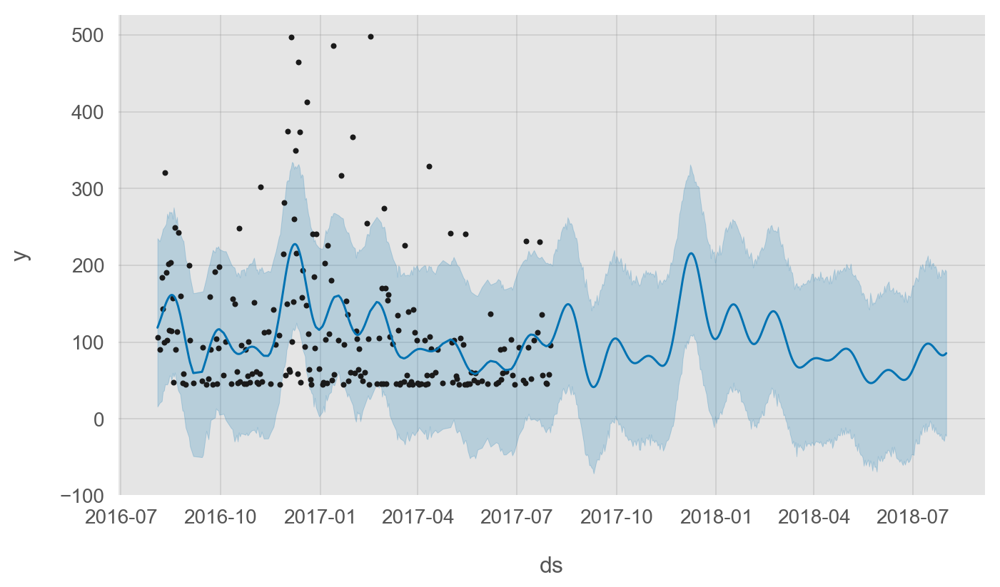

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$8,666","$10,675",+23%
Q1,"$7,168","$9,920",+38%
Q2,"$3,548","$6,153",+73%


In [459]:
forecast, forecast_results, fig = product_forcast(
    df,
    'Google Men\'s  Zip Hoodie',
    ignore_std=1,
    weekly_seasonality=False
)
plt.show()
forecast_results

Run for each of the top 30 Top selling products

--------------------
Google Sunglasses
Ignoring 25 outlier points
Found 257 product transactions


/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


Generating quarterly forecasts


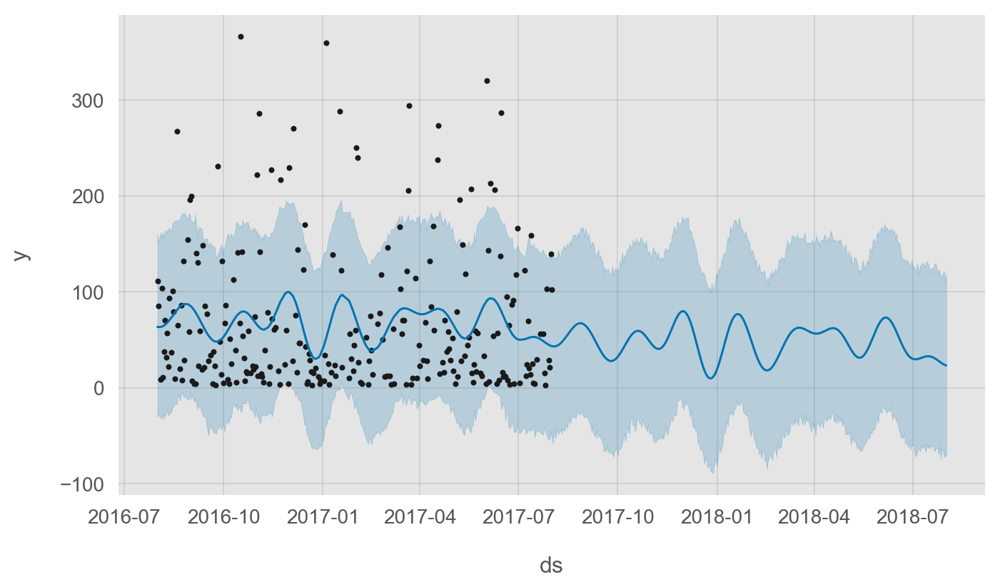

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$4,399","$4,450",+1%
Q1,"$3,857","$4,361",+13%
Q2,"$4,779","$4,764",-0%


--------------------
Google Laptop and Cell Phone Stickers
Ignoring 21 outlier points
Found 273 product transactions
Generating quarterly forecasts


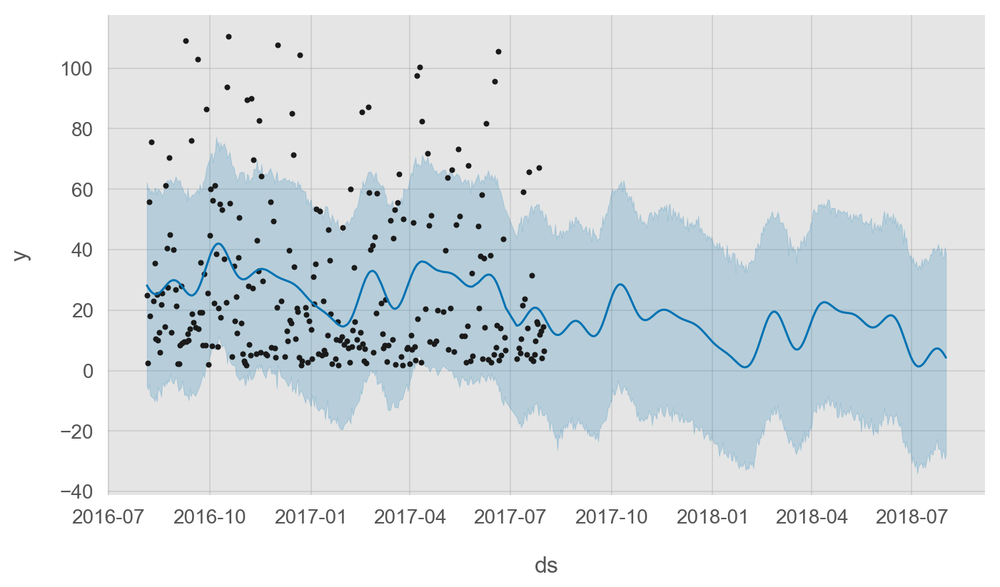

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$2,357","$1,749",-26%
Q1,"$1,565",$819,-48%
Q2,"$1,825","$1,570",-14%


--------------------
Google 22 oz Water Bottle
Ignoring 25 outlier points
Found 228 product transactions
Generating quarterly forecasts


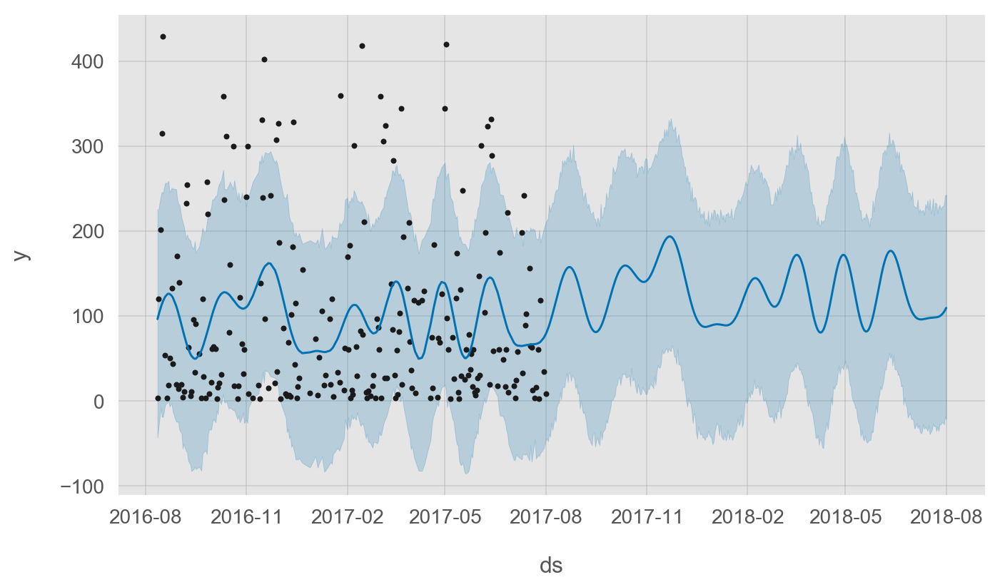

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$6,112","$13,291",+117%
Q1,"$5,815","$11,240",+93%
Q2,"$5,643","$11,673",+107%


--------------------
Google Men's 100% Cotton Short Sleeve Hero Tee White
Ignoring 18 outlier points
Found 258 product transactions
Generating quarterly forecasts


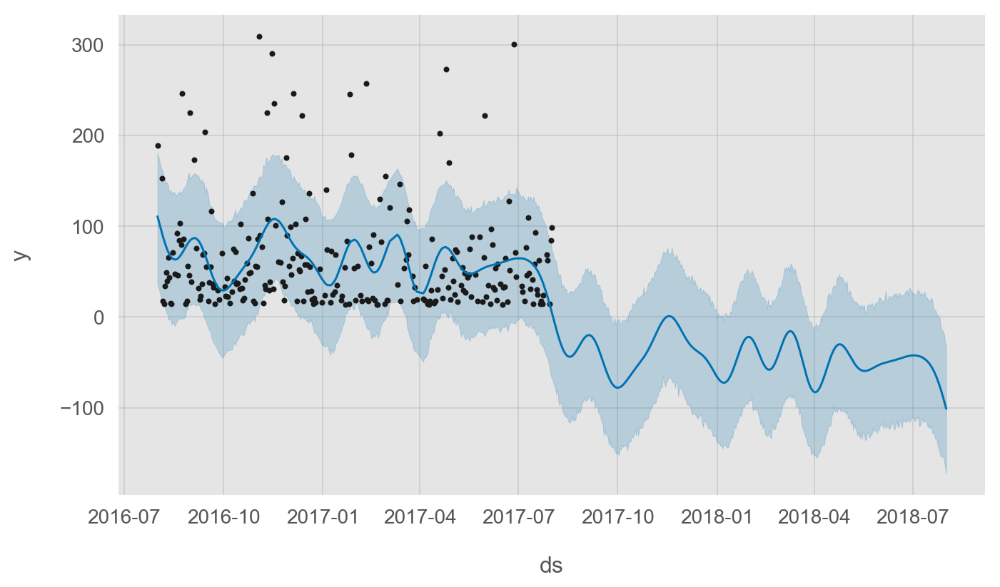

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$5,229","$-3,355",-164%
Q1,"$3,137","$-4,084",-230%
Q2,"$3,587","$-4,626",-229%


--------------------
Google Men's 100% Cotton Short Sleeve Hero Tee Black
Ignoring 17 outlier points
Found 247 product transactions
Generating quarterly forecasts


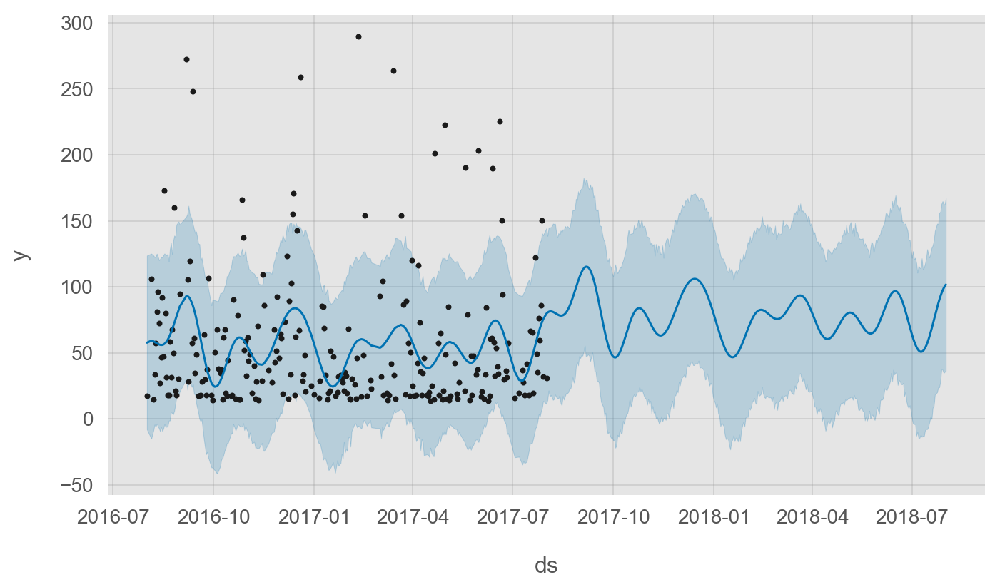

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$3,689","$7,304",+98%
Q1,"$2,797","$6,623",+137%
Q2,"$3,464","$6,851",+98%


--------------------
Google Men's 100% Cotton Short Sleeve Hero Tee Navy
Ignoring 16 outlier points
Found 226 product transactions
Generating quarterly forecasts


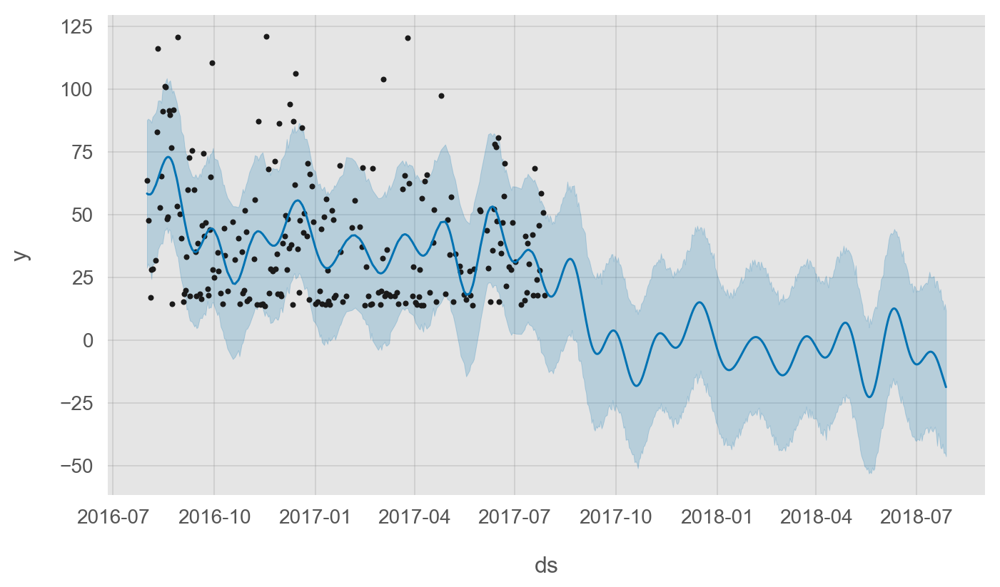

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$2,553",$-63,-102%
Q1,"$1,687",$-513,-130%
Q2,"$1,848",$-294,-116%


--------------------
Google Men's  Zip Hoodie
Ignoring 4 outlier points
Found 218 product transactions
Generating quarterly forecasts


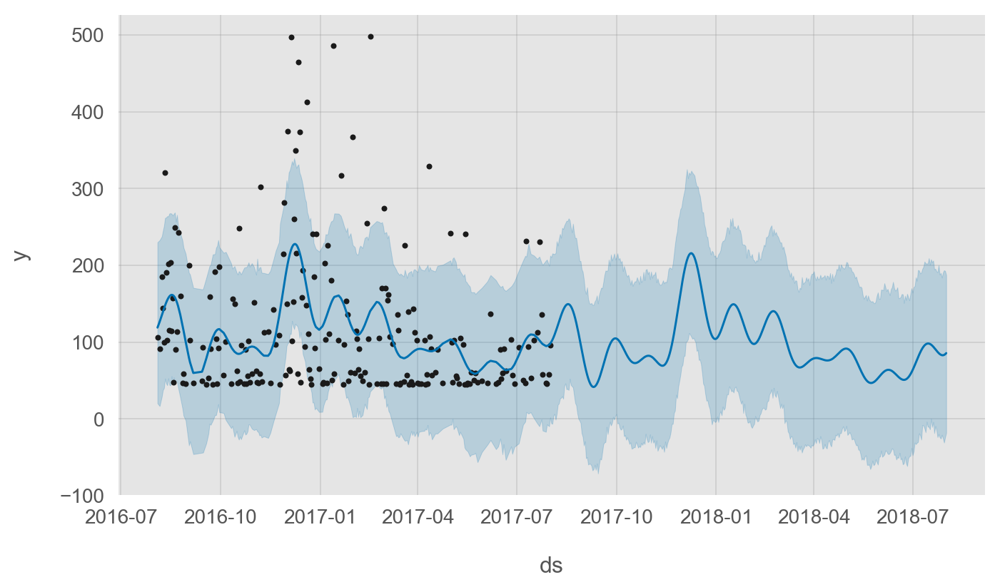

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$8,666","$10,675",+23%
Q1,"$7,168","$9,920",+38%
Q2,"$3,548","$6,153",+73%


--------------------
Recycled Paper Journal Set
Ignoring 29 outlier points
Found 160 product transactions
Generating quarterly forecasts


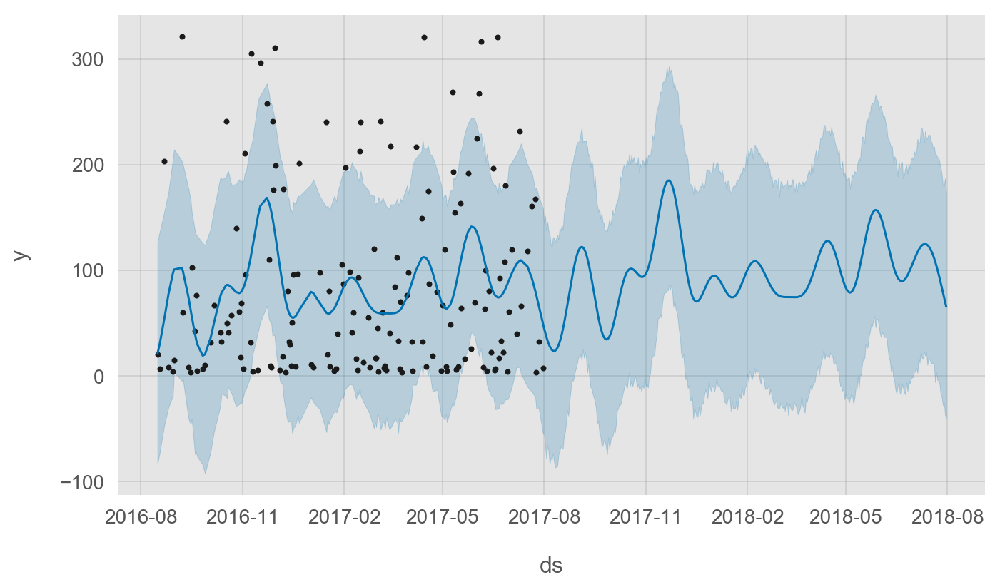

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$3,932","$10,037",+155%
Q1,"$3,028","$7,741",+156%
Q2,"$4,682","$10,292",+120%


INFO:fbprophet:n_changepoints greater than number of observations.Using 15.0.


--------------------
BLM Sweatshirt
Ignoring 5 outlier points
Found 20 product transactions
Generating quarterly forecasts


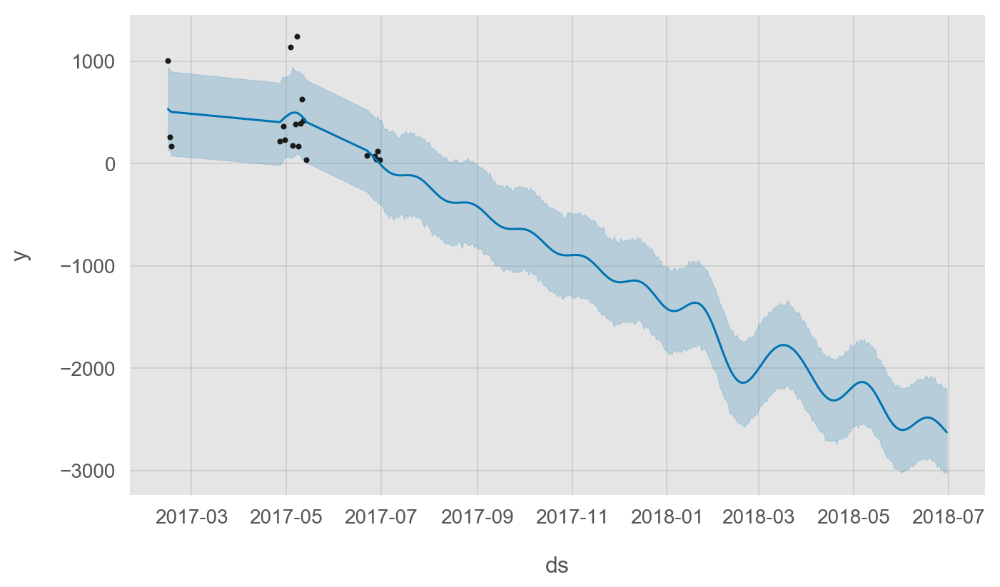

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,$0,"$-92,284",-inf%
Q1,"$1,433","$-157,462",-11091%
Q2,"$5,737","$-214,612",-3841%


--------------------
Engraved Ceramic Google Mug
Ignoring 15 outlier points
Found 162 product transactions
Generating quarterly forecasts


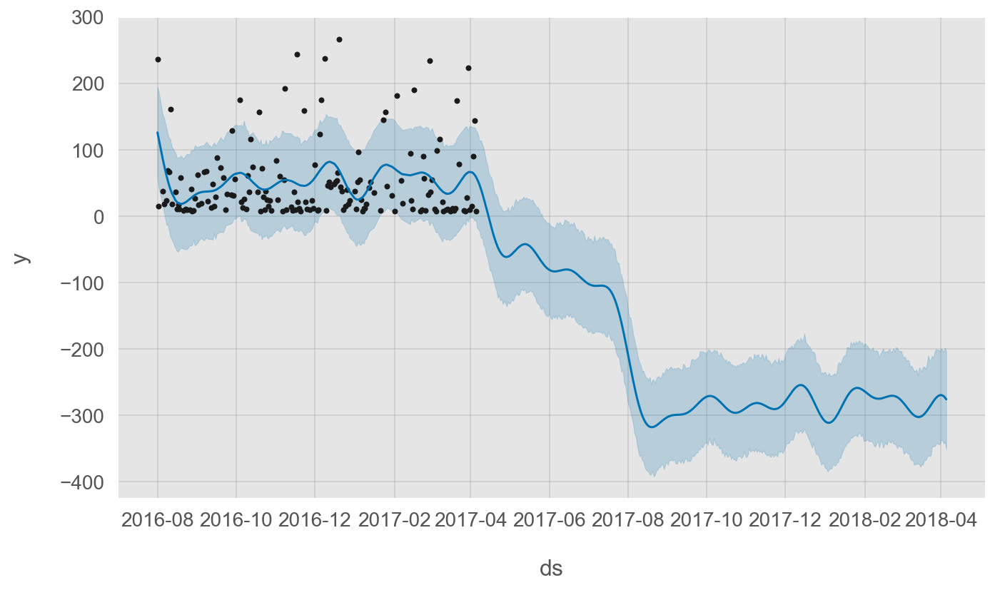

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$3,446","$-25,828",-850%
Q1,"$2,817","$-25,317",-999%
Q2,$256,"$-1,358",-630%


--------------------
Google Twill Cap
Ignoring 12 outlier points
Found 218 product transactions
Generating quarterly forecasts


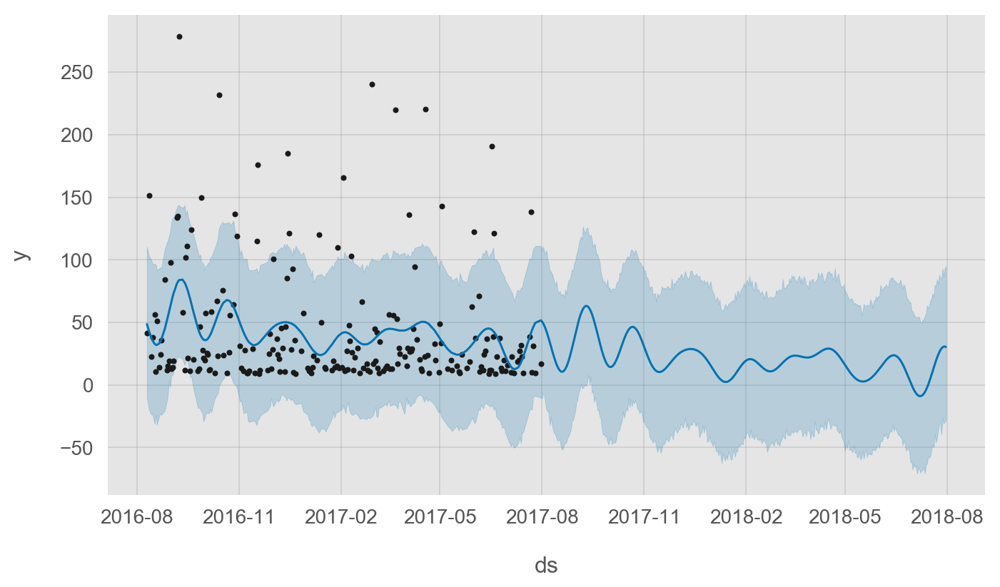

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$2,611","$2,326",-11%
Q1,"$2,094","$1,346",-36%
Q2,"$2,114","$1,477",-30%


--------------------
26 oz Double Wall Insulated Bottle
Ignoring 8 outlier points
Found 205 product transactions
Generating quarterly forecasts


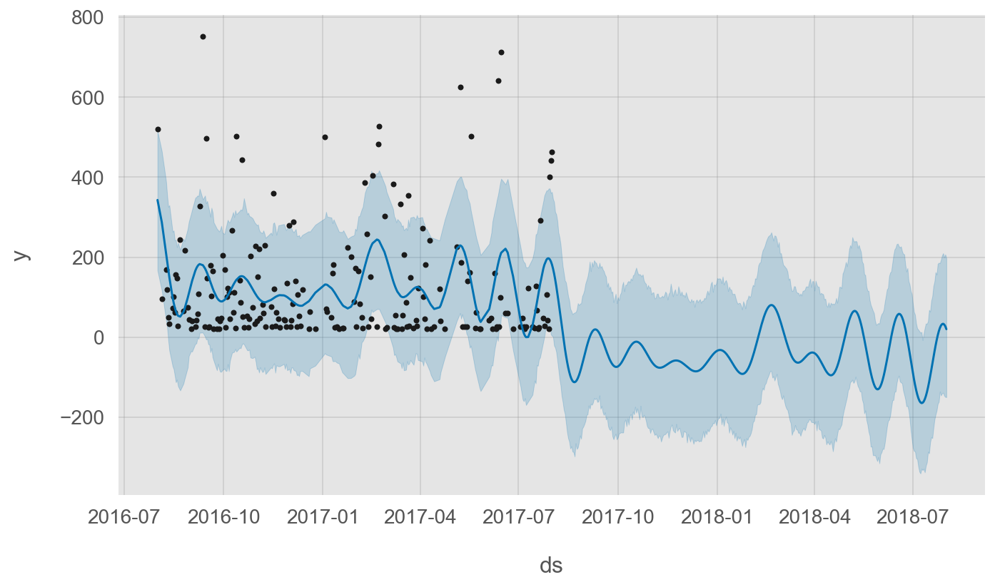

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$6,101","$-5,224",-186%
Q1,"$6,824","$-2,180",-132%
Q2,"$5,084","$-2,774",-155%


--------------------
Google Men's Vintage Badge Tee Black
Ignoring 7 outlier points
Found 166 product transactions
Generating quarterly forecasts


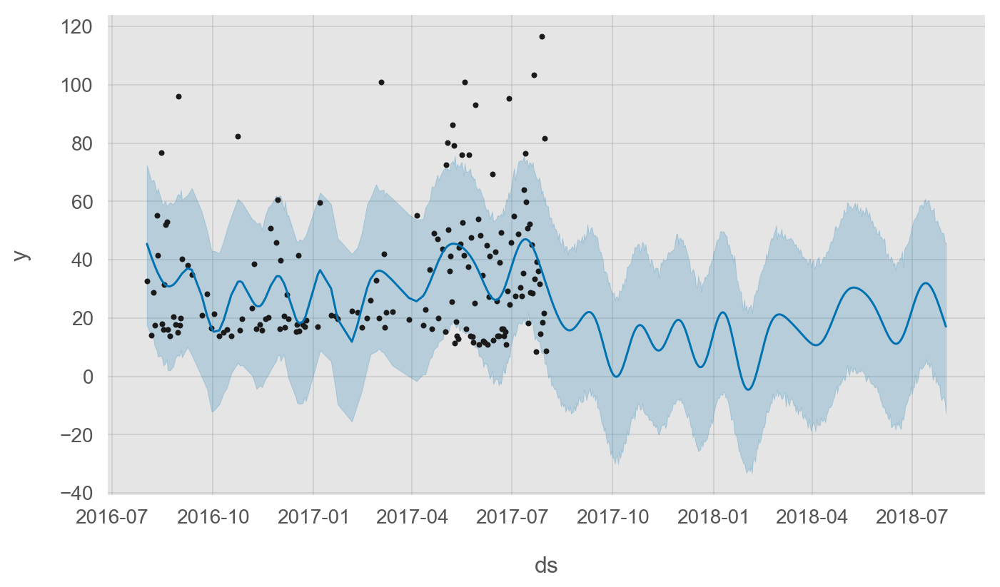

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,$792,$981,+24%
Q1,$522,"$1,134",+117%
Q2,"$2,377","$1,835",-23%


--------------------
Google Men's 100% Cotton Short Sleeve Hero Tee Red
Ignoring 17 outlier points
Found 185 product transactions
Generating quarterly forecasts


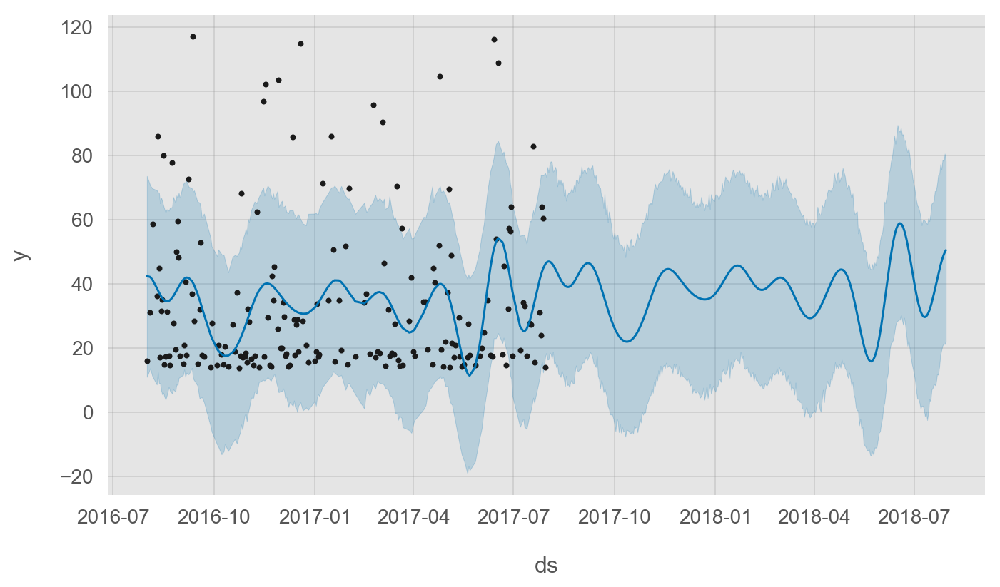

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$1,624","$3,162",+95%
Q1,"$1,319","$3,530",+168%
Q2,"$1,538","$3,414",+122%


--------------------
Red Shine 15 oz Mug
Ignoring 11 outlier points
Found 176 product transactions
Generating quarterly forecasts


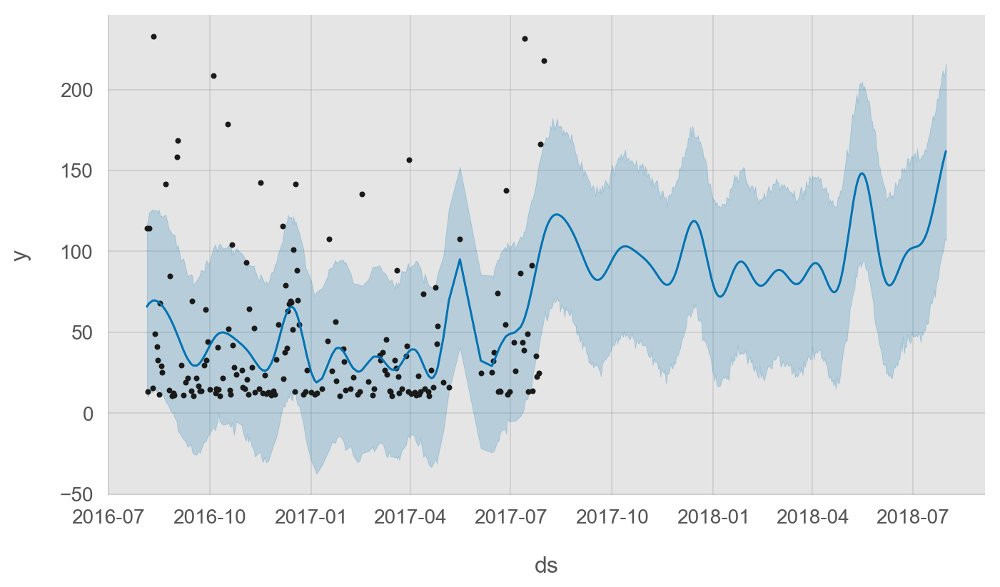

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$2,611","$8,935",+242%
Q1,"$1,332","$7,528",+465%
Q2,"$1,009","$9,185",+811%


--------------------
Recycled Mouse Pad
Ignoring 7 outlier points
Found 201 product transactions
Generating quarterly forecasts


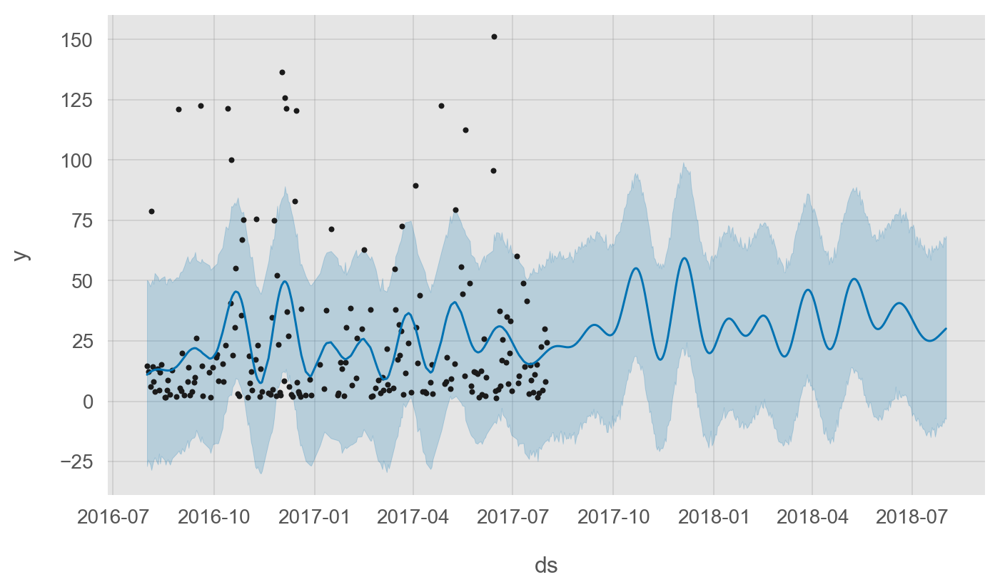

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$1,771","$3,510",+98%
Q1,$807,"$2,770",+243%
Q2,"$1,317","$3,310",+151%


--------------------
YouTube Custom Decals
Ignoring 5 outlier points
Found 212 product transactions
Generating quarterly forecasts


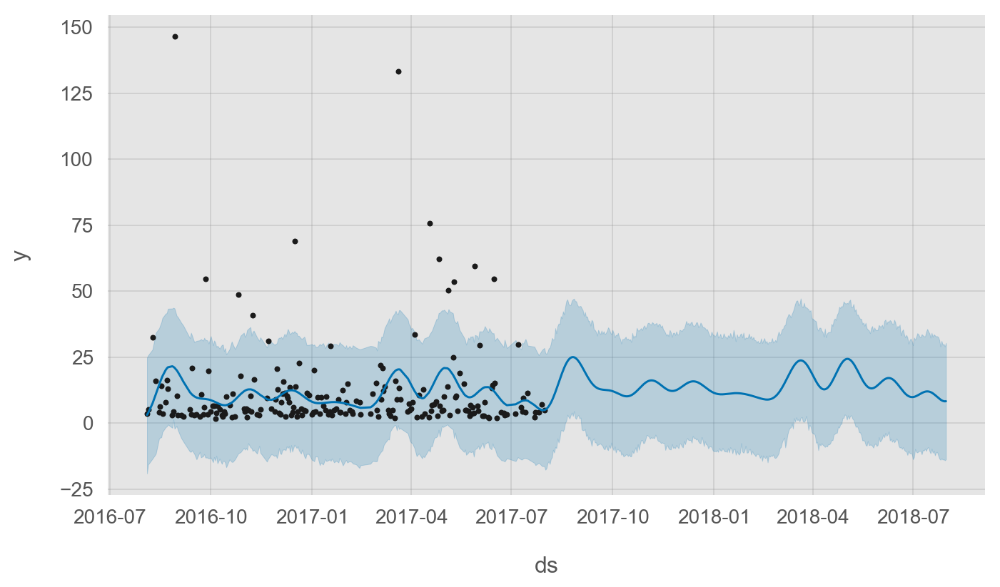

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,$607,"$1,229",+102%
Q1,$544,"$1,221",+124%
Q2,$747,"$1,482",+98%


--------------------
Maze Pen
Ignoring 16 outlier points
Found 181 product transactions
Generating quarterly forecasts


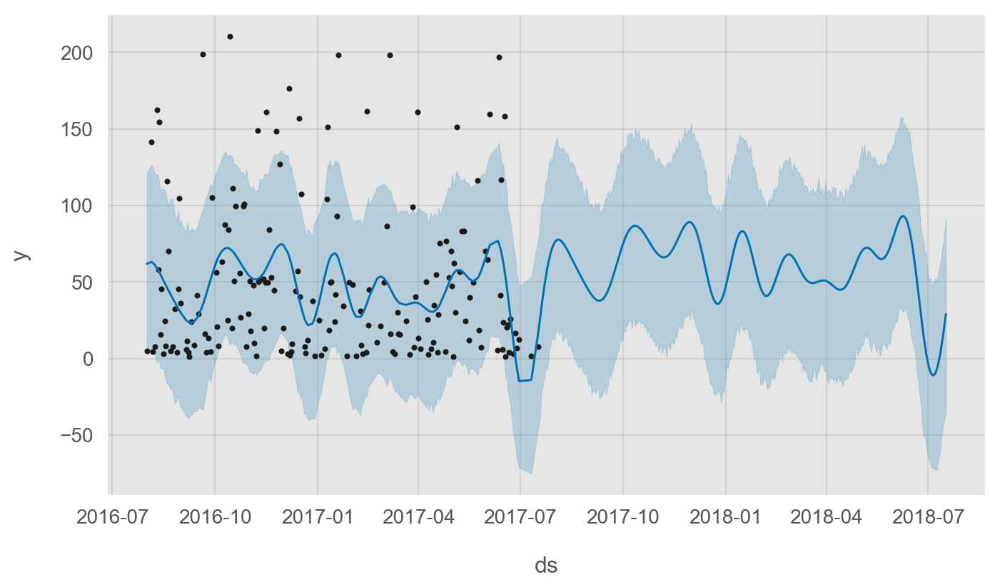

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$3,016","$6,531",+117%
Q1,"$1,964","$5,307",+170%
Q2,"$2,259","$5,609",+148%


--------------------
Windup Android
Ignoring 24 outlier points
Found 169 product transactions
Generating quarterly forecasts


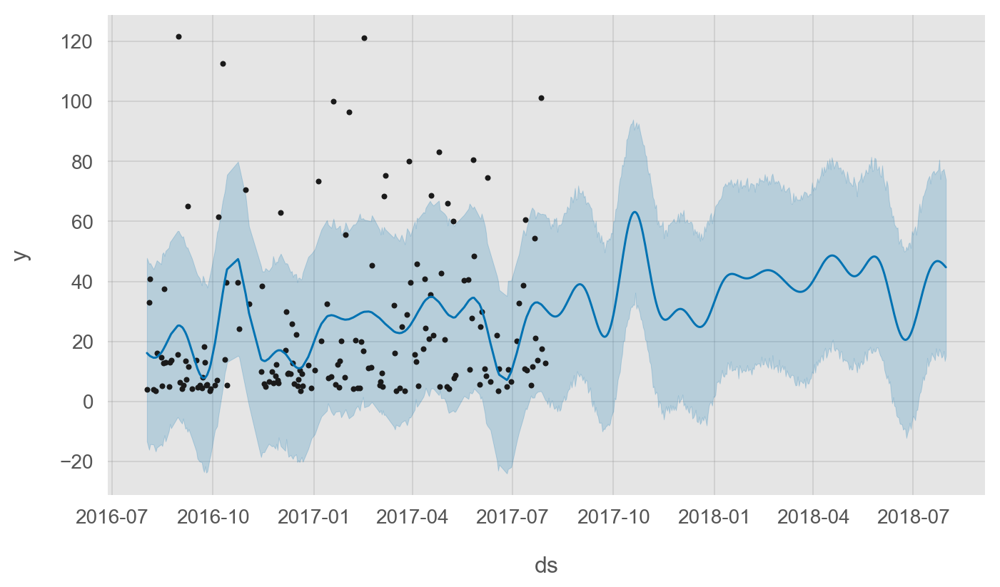

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,$790,"$3,440",+335%
Q1,"$1,131","$3,634",+221%
Q2,"$1,081","$3,662",+239%


--------------------
Foam Can and Bottle Cooler
Ignoring 19 outlier points
Found 162 product transactions
Generating quarterly forecasts


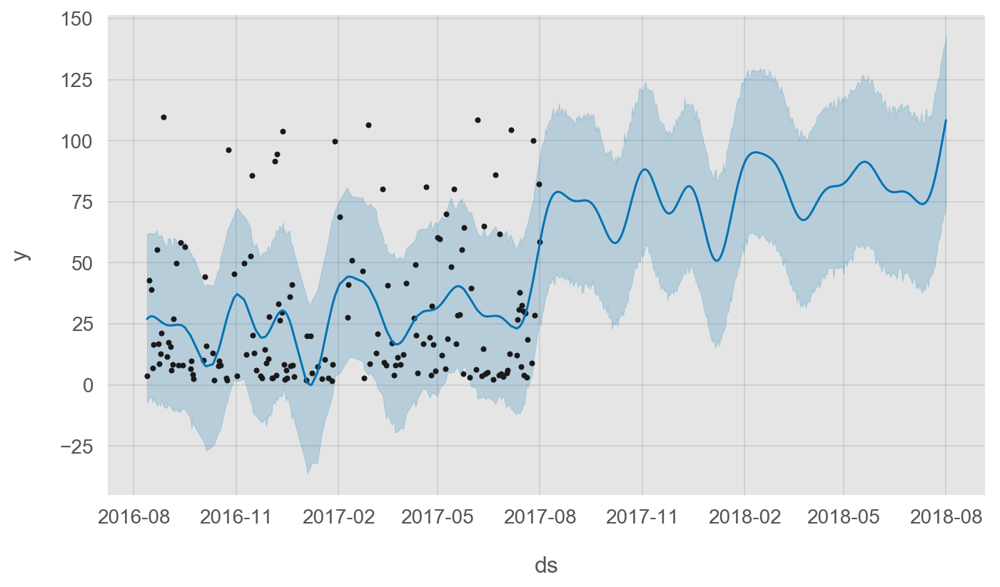

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$1,075","$6,769",+529%
Q1,$767,"$7,006",+814%
Q2,"$1,288","$7,477",+480%


--------------------
Badge Holder
Ignoring 18 outlier points
Found 168 product transactions
Generating quarterly forecasts


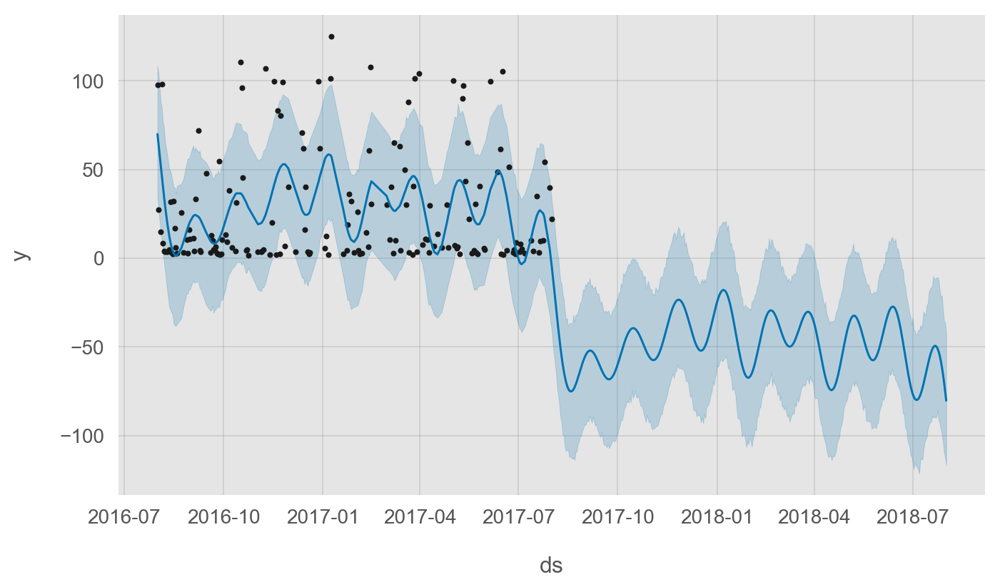

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$1,288","$-3,946",-406%
Q1,"$1,249","$-3,662",-393%
Q2,"$1,055","$-4,494",-526%


--------------------
Sport Bag
Ignoring 11 outlier points
Found 176 product transactions
Generating quarterly forecasts


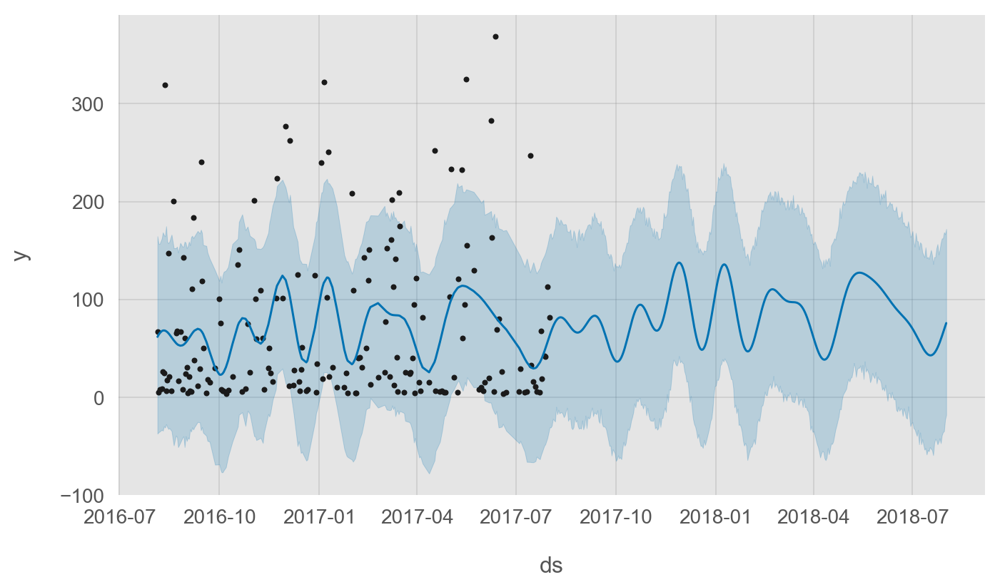

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$2,720","$7,627",+180%
Q1,"$3,653","$8,378",+129%
Q2,"$2,950","$8,317",+182%


--------------------
Leatherette Journal
Ignoring 6 outlier points
Found 174 product transactions
Generating quarterly forecasts


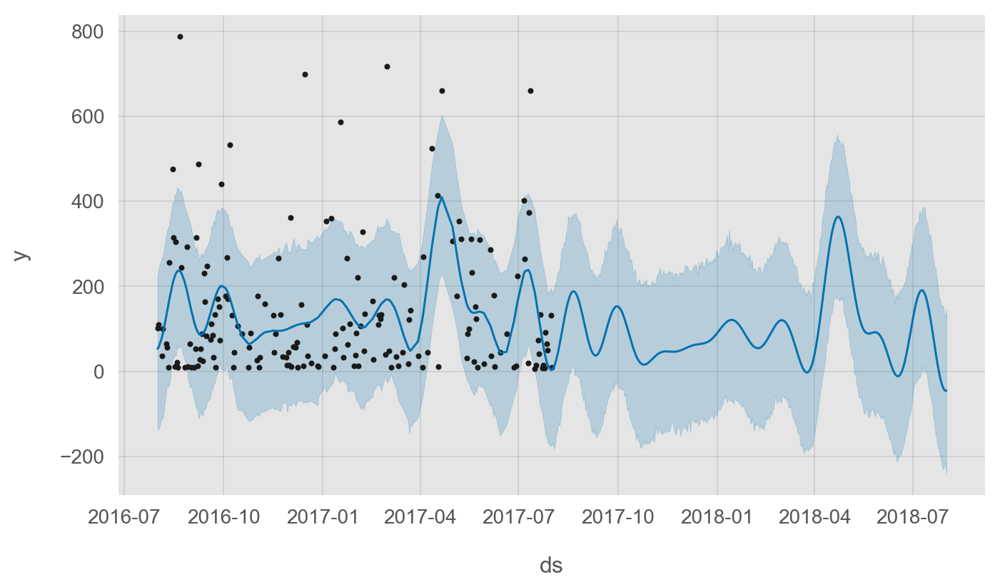

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$4,511","$5,414",+20%
Q1,"$5,396","$7,055",+31%
Q2,"$5,367","$12,891",+140%


--------------------
Google Women's Short Sleeve Hero Tee White
Ignoring 10 outlier points
Found 142 product transactions
Generating quarterly forecasts


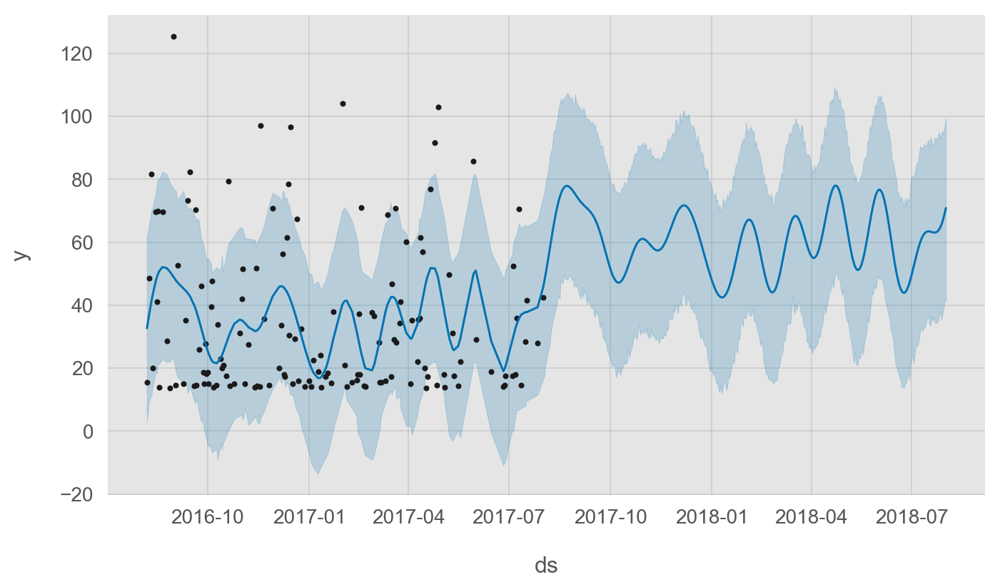

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$1,439","$5,461",+279%
Q1,"$1,088","$4,984",+358%
Q2,$946,"$5,648",+497%


--------------------
Google Men's Bike Short Sleeve Tee Charcoal
Ignoring 14 outlier points
Found 126 product transactions
Generating quarterly forecasts


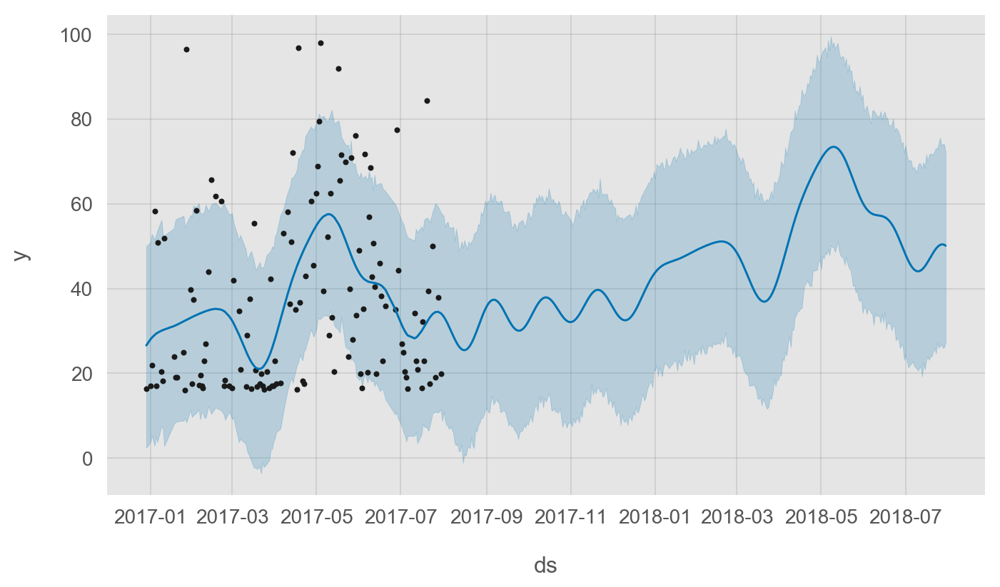

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,$16,"$3,316",+20133%
Q1,"$1,504","$4,131",+175%
Q2,"$2,608","$5,577",+114%


--------------------
Google Metallic Notebook Set
Ignoring 12 outlier points
Found 162 product transactions
Generating quarterly forecasts


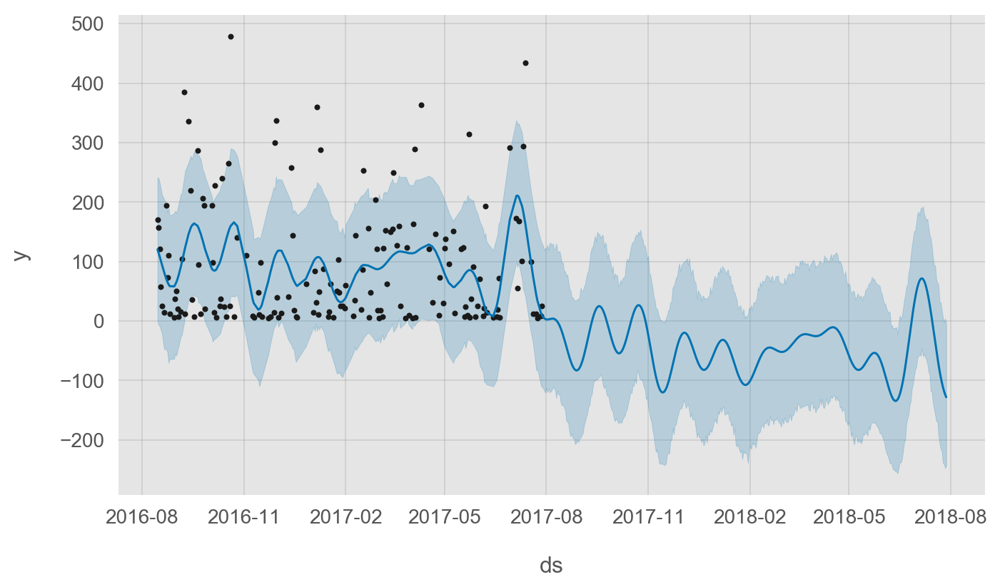

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$3,342","$-4,485",-234%
Q1,"$3,823","$-4,816",-226%
Q2,"$3,236","$-5,224",-261%


--------------------
Google Kick Ball
Ignoring 10 outlier points
Found 168 product transactions
Generating quarterly forecasts


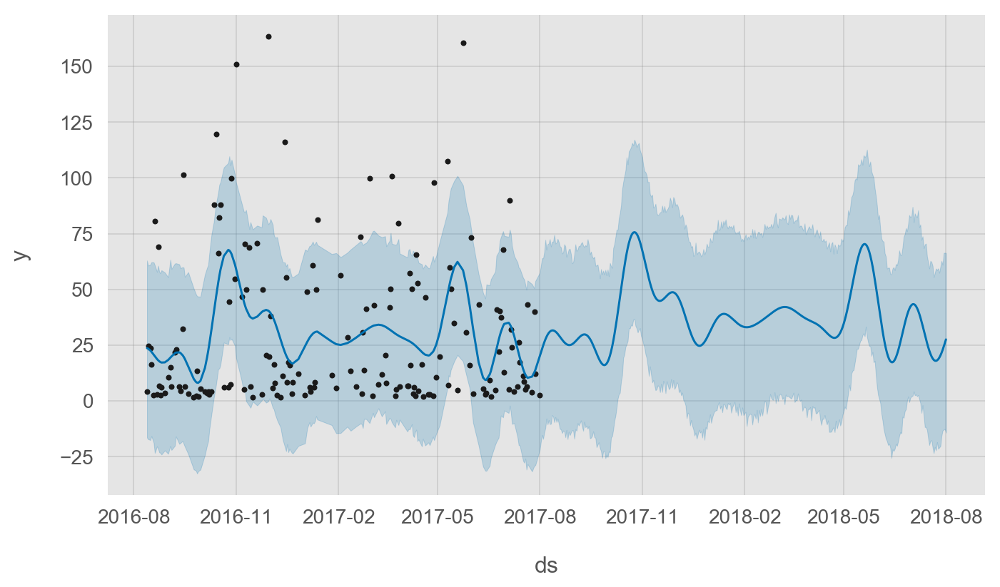

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$1,729","$4,201",+143%
Q1,"$1,033","$3,364",+226%
Q2,"$1,315","$3,577",+172%


--------------------
Google Women's Fleece Hoodie
Ignoring 7 outlier points
Found 142 product transactions
Generating quarterly forecasts


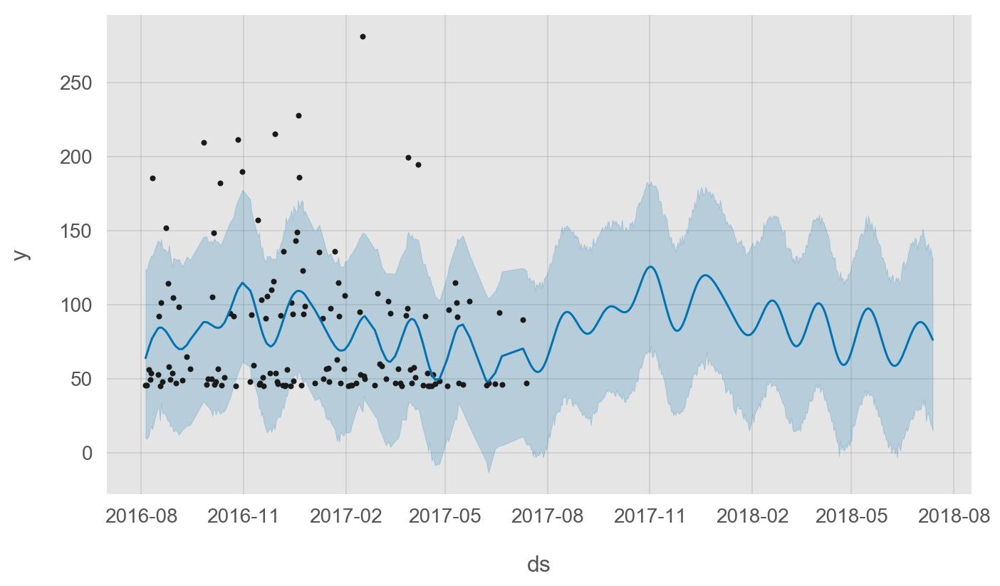

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$4,631","$9,715",+110%
Q1,"$3,071","$8,075",+163%
Q2,"$1,751","$7,057",+303%


--------------------
YouTube Leatherette Notebook Combo
Ignoring 17 outlier points
Found 136 product transactions
Generating quarterly forecasts


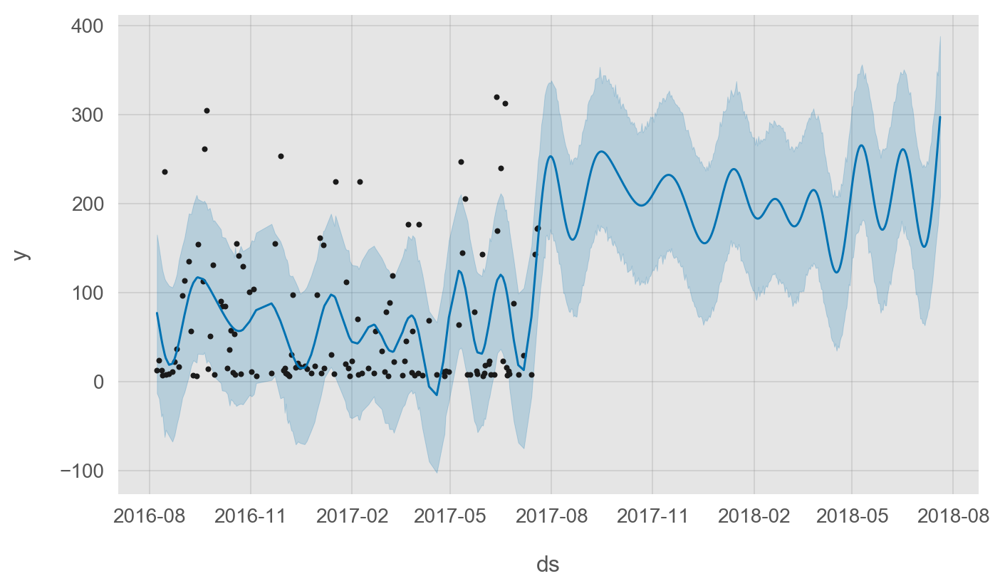

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,"$1,906","$18,428",+867%
Q1,"$1,852","$18,188",+882%
Q2,"$2,510","$18,340",+631%


--------------------
Google Doodle Decal
Ignoring 10 outlier points
Found 141 product transactions
Generating quarterly forecasts


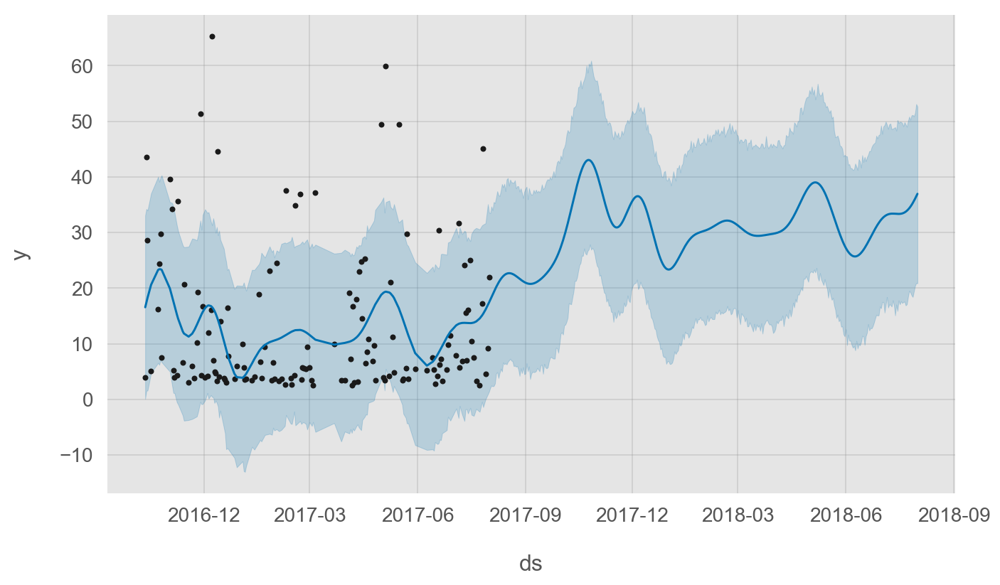

,Prev Year,Forecasted,YoY (%)
Reporting Period,,,
Q4,$652,"$3,138",+381%
Q1,$356,"$2,653",+646%
Q2,$562,"$2,907",+418%


In [460]:
for product in df.v2ProductName.value_counts(ascending=False).head(30).index.tolist():
    print('-'*20)
    print(Fore.RED + product + Style.RESET_ALL)
    forecast, forecast_results, fig = product_forcast(
        df,
        product,
        ignore_std=1,
        weekly_seasonality=False
    )
    plt.show()
    display(forecast_results)

In [26]:
from IPython.display import HTML
HTML('<style>div.text_cell_render{font-size:130%;padding-top:50px;padding-bottom:50px}</style>')